# <font color='blue'> Masters Project Title: </font>

### <font color='blue'> Predicting Customer Lifetime Value In Retail/Banking Based On Customer Behaviour Analysis</font >
_Lucky Mishra (July 2021) Cohort 8_

<font color='blue'> This notebook aims at analyzing the content of an E-commerce database that lists purchases made by $\sim$4000 customers over a period of one year (from 2010/12/01 to 2011/12/09). Based on this analysis, I develop a model that allows to anticipate the purchases that will be made by a new customer, during the following year and this, from its first purchase. <br> </font>



### As part of: Masters in Data Science Dissertation

### Research Questions:
#### `Q1:` *Will it be useful to segment customers by their behavioural pattern?* 
#### `Q2:` *How RFM can be used to derive CLV for new customers?* 
#### `Q3:` *Will predicting customer lifetime monetary value be more beneficial compare to predicting their segments?* 
#### `Q4:` *Which Interpretable methods can be used to explain clustering and regression-based models?*
#### `Q5:` *Are model agnostic methods result trustworthy?* 



##### Dataset downloaded from: https://archive.ics.uci.edu/ml/datasets/Online+Retail+II

#### This file contains following sectios of the overall solution:

#### <font color='blue'>*Experiment 12 - CLV Cohort calculation* </font>
   - 1.1 Split data into 21 months and 3 months
   - 1.2 Generate CLV clusters for first 21 month.
   - 1.3 Generate CLV clusters for 3 months.
   - 1.4 combine the 3months data with 21 months to compare the CLV of the customers   
   - 1.5 Use clusters generated from Experiment 5 using MANUAL RFM calculation and with cancelled orders and run all the selected models.   
   - 1.6 Create a voting classifier by ensemble all the selected classifier to get the best precision.
 
#### <font color='blue'>*Conclusion*</font>

In [1]:
%matplotlib inline
from __future__ import division
from chart_studio import plotly as py 
from crm_rfm_modeling import rfm
from crm_rfm_modeling.rfm import RFM
from datetime import datetime, timedelta,date
from datetime import datetime,timedelta
from IPython.display import display
from IPython.display import display, HTML
from lifetimes.plotting import *
from lifetimes.utils import *
from math import isnan
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from numpy.random import uniform
from pathlib import Path
from plotly.offline import init_notebook_mode,iplot
from random import sample
from scipy.cluster.hierarchy import cut_tree
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import linkage
from sklearn import neighbors, linear_model, svm, tree, ensemble
from sklearn import preprocessing, model_selection, metrics, feature_selection
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.datasets.samples_generator import make_blobs
from sklearn.decomposition import PCA
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import GridSearchCV, learning_curve
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
import datetime as dt
import datetime, nltk, warnings
import itertools
import matplotlib
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pandas_profiling as pp
import plotly.graph_objects as go
import plotly.graph_objs as go
import plotly.offline as pyoff
import seaborn as sns
import xgboost as xgb
from xgboost import XGBClassifier,XGBRegressor
from sklearn.metrics import classification_report
from sklearn.ensemble import AdaBoostRegressor
from sklearn import neighbors, linear_model, svm, tree, ensemble
import lightgbm as lgb
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from catboost import CatBoostClassifier
from catboost import CatBoostClassifier
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer
import lime
import lime.lime_tabular
from plotnine import ggplot,  geom_line,geom_point, aes, stat_smooth, facet_wrap,scale_x_date,theme,element_text
import plotnine as p9
from plotnine.data import mtcars
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import OneHotEncoder
init_notebook_mode(connected=True)
plt.rcParams["patch.force_edgecolor"] = True
plt.style.use('fivethirtyeight')
mpl.rc('patch', edgecolor = 'dimgray', linewidth=1)
%matplotlib inline
pd. set_option('display.max_columns', None) # or 1000.
pd. set_option('display.max_rows', None) # or 1000.
pd. set_option('display.max_colwidth', -1) # or 199.
warnings.filterwarnings("ignore")

import warnings
warnings.filterwarnings("ignore")

In [2]:
df_rfm =pd.read_excel(open('df_year_2009_2011_clean_with_C.xlsx', 'rb'))

#df_rfm = df_rfm.query("Country=='United Kingdom'").reset_index(drop=True)

grouped_rfm_df =pd.read_excel(open('grouped_rfm_df_with_C.xlsx', 'rb'))

In [3]:
df_model = pd.merge(df_rfm, grouped_rfm_df,  on='Customer ID', how='left')

In [4]:
df_model.count()

Invoice              625508
StockCode            625508
Description          625508
Quantity             625508
InvoiceDate          625508
Price                625508
Customer ID          625508
Country              625508
Revenue              625508
Month                625508
Time                 625508
Year                 625508
Day                  625508
Quarter              625508
Week_Day             625508
BillingMonthYear     625508
Recency              320799
Frequency            320799
Monetary             320799
KMeans_cluster_id    320799
dbscan_label         320799
gmm_cluster_id       320799
dtype: int64

In [5]:
df_model.isnull().sum()

Invoice              0     
StockCode            0     
Description          0     
Quantity             0     
InvoiceDate          0     
Price                0     
Customer ID          0     
Country              0     
Revenue              0     
Month                0     
Time                 0     
Year                 0     
Day                  0     
Quarter              0     
Week_Day             0     
BillingMonthYear     0     
Recency              304709
Frequency            304709
Monetary             304709
KMeans_cluster_id    304709
dbscan_label         304709
gmm_cluster_id       304709
dtype: int64

###### <font color='blue'>GMM clustering output is considered to be the best one hence dropping the K-means and DBSCAN output</font>

In [6]:
df_model.drop(['KMeans_cluster_id','dbscan_label'],axis=1, inplace=True)

In [7]:
df_model.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country,Revenue,Month,Time,Year,Day,Quarter,Week_Day,BillingMonthYear,Recency,Frequency,Monetary,gmm_cluster_id
0,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:44:59.999999,1.25,13085,United Kingdom,30.00,12,07:45:00,2009,1,4,Tuesday,200912,158.0,59.0,1064.08,4.0
1,489434,21871,SAVE THE PLANET MUG,24,2009-12-01 07:44:59.999999,1.25,13085,United Kingdom,30.00,12,07:45:00,2009,1,4,Tuesday,200912,158.0,59.0,1064.08,4.0
2,489435,22350,CAT BOWL,12,2009-12-01 07:46:00.000000,2.55,13085,United Kingdom,30.60,12,07:46:00,2009,1,4,Tuesday,200912,158.0,59.0,1064.08,4.0
3,489435,22353,LUNCHBOX WITH CUTLERY FAIRY CAKES,12,2009-12-01 07:46:00.000000,2.55,13085,United Kingdom,30.60,12,07:46:00,2009,1,4,Tuesday,200912,158.0,59.0,1064.08,4.0
4,489436,21754,HOME BUILDING BLOCK WORD,3,2009-12-01 09:06:00.000001,5.95,13078,United Kingdom,17.85,12,09:06:00,2009,1,4,Tuesday,200912,NaN,NaN,NaN,NaN


In [8]:
grouped_rfm_df.groupby('gmm_cluster_id')['Customer ID'].count()

gmm_cluster_id
0    1657
1    347 
2    1409
3    312 
4    1093
Name: Customer ID, dtype: int64

### CLV
### Predict the CLV cluster for 90 days 

In [9]:
df_model.columns

Index(['Invoice', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'Price', 'Customer ID', 'Country', 'Revenue', 'Month', 'Time', 'Year',
       'Day', 'Quarter', 'Week_Day', 'BillingMonthYear', 'Recency',
       'Frequency', 'Monetary', 'gmm_cluster_id'],
      dtype='object')

In [10]:
df_model_Sel=df_model[['Invoice', 'StockCode', 'Description', 'Quantity', 'InvoiceDate','Price', 'Customer ID', 'Revenue']]
df_model_Sel['InvoiceDate']= pd.to_datetime(df_model_Sel['InvoiceDate']).dt.date

n_days =90
max_date=df_model_Sel.InvoiceDate.max()
cutoff = max_date- pd.to_timedelta(n_days, unit="d")
print("Cut off Date to seperate the data",cutoff,"\n\n")



Cut off Date to seperate the data 2011-09-10 




###### <font color='blue'>Create Source data after splitting by cutoff day</font> 

In [11]:
df_first_yr =df_model_Sel[df_model_Sel['InvoiceDate']<=cutoff]

<font color='blue'>Create Target data after splitting by cutoff day</font> 

In [12]:
df_sec_yr = df_model_Sel[df_model_Sel['InvoiceDate']>cutoff]

In [13]:
df_first_yr.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Revenue
0,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01,1.25,13085,30.00
1,489434,21871,SAVE THE PLANET MUG,24,2009-12-01,1.25,13085,30.00
2,489435,22350,CAT BOWL,12,2009-12-01,2.55,13085,30.60
3,489435,22353,LUNCHBOX WITH CUTLERY FAIRY CAKES,12,2009-12-01,2.55,13085,30.60
4,489436,21754,HOME BUILDING BLOCK WORD,3,2009-12-01,5.95,13078,17.85


In [14]:
df_first_yr.count()

Invoice        495767
StockCode      495767
Description    495767
Quantity       495767
InvoiceDate    495767
Price          495767
Customer ID    495767
Revenue        495767
dtype: int64

In [15]:
df_sec_yr.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Revenue
495767,566225,22384,LUNCH BAG PINK POLKADOT,6,2011-09-11,1.65,16899,9.90
495768,566225,20725,LUNCH BAG RED RETROSPOT,6,2011-09-11,1.65,16899,9.90
495769,566225,23169,CLASSIC GLASS COOKIE JAR,3,2011-09-11,4.15,16899,12.45
495770,566225,84029E,RED WOOLLY HOTTIE WHITE HEART.,3,2011-09-11,4.25,16899,12.75
495771,566225,21479,WHITE SKULL HOT WATER BOTTLE,3,2011-09-11,4.25,16899,12.75


In [16]:
df_sec_yr.count()

Invoice        129741
StockCode      129741
Description    129741
Quantity       129741
InvoiceDate    129741
Price          129741
Customer ID    129741
Revenue        129741
dtype: int64

In [17]:
def RFM_Features(df, customerID, invoiceDate, transID, sales):
    ''' Create the Recency, Frequency, and Monetary features from the data '''
    # Final date in the data + 1 to create latest date
    latest_date = df[invoiceDate].max() + timedelta(1)
    
    # RFM feature creation
    RFMScores = df.groupby(customerID).agg({invoiceDate: lambda x: (latest_date - x.max()).days, 
                                          transID: lambda x: len(x), sales: lambda x: sum(x)})
    
    # Converting invoiceDate to int since this contains number of days
    RFMScores[invoiceDate] = RFMScores[invoiceDate].astype(int)
    
    # Renaming column names to Recency, Frequency and Monetary
    RFMScores.rename(columns={invoiceDate: 'Recency', transID: 'Frequency', sales: 'Monetary'}, inplace=True)
    
    return RFMScores.reset_index()

Text(0.5, 1.0, '(RFM) Recency')

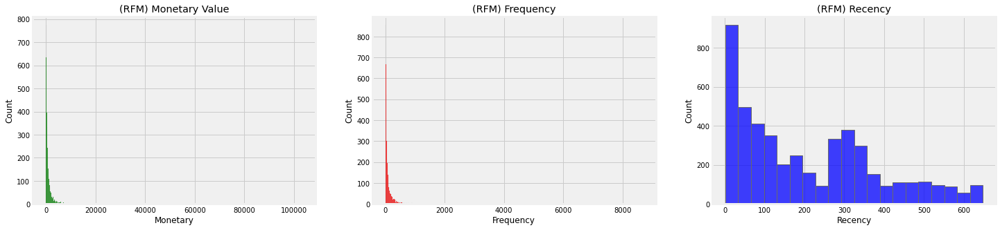

In [18]:
df_first_yr_group = RFM_Features(df=df_first_yr, customerID= "Customer ID", invoiceDate = "InvoiceDate", transID= "Invoice", sales="Revenue")
 

plt.figure(figsize=(30,5))
plt.subplot(141)
sns.histplot(df_first_yr_group["Monetary"], color = "g" )#  , showfliers = False)
plt.title("(RFM) Monetary Value")
plt.subplot(142)
sns.histplot(df_first_yr_group["Frequency"] ,color = "r" )#  , showfliers = False)
plt.title("(RFM) Frequency") 
plt.subplot(143)
sns.histplot(df_first_yr_group["Recency"] ,color = "b" )#  , showfliers = False)
plt.title("(RFM) Recency") 
 

In [19]:
df_first_yr_group.head()

,Customer ID,Recency,Frequency,Monetary
0,12346,341,37,311.37
1,12413,146,22,369.00
2,12426,104,73,1086.86
3,12427,261,8,112.65
4,12437,8,361,5914.65


#### Prepare target  data

In [20]:
df_sec_yr_group = df_sec_yr.groupby('Customer ID')['Revenue'].sum().reset_index()
df_sec_yr_group.columns = ['Customer ID','3mnth_Revenue']

In [21]:
df_sec_yr_group.head()

,Customer ID,3mnth_Revenue
0,12413,176.20
1,12427,262.36
2,12437,1482.48
3,12471,2034.66
4,12472,1082.48


In [22]:
# 2. rescaling
rfm_df_first_temp = df_first_yr_group[['Monetary', 'Frequency', 'Recency']]

# instantiate
scaler = StandardScaler()

# fit_transform
rfm_df_first_scaled = scaler.fit_transform(rfm_df_first_temp)
rfm_df_first_scaled.shape

rfm_df_first_scaled = pd.DataFrame(rfm_df_first_scaled)
rfm_df_first_scaled.columns = ['Monetary', 'Frequency', 'Recency']
rfm_df_first_scaled.head()

,Monetary,Frequency,Recency
0,-0.314916,-0.264771,0.756963
1,-0.291870,-0.324940,-0.356893
2,-0.004800,-0.120363,-0.596800
3,-0.394384,-0.381099,0.299996
4,1.925821,1.034898,-1.145160


In [23]:
#fit the fist year model
X_first = rfm_df_first_scaled[['Monetary', 'Frequency', 'Recency']].values
                              
gmm_first = GaussianMixture(n_components=5,covariance_type='spherical').fit(X_first)
gmm_first_labels = gmm_first.predict(X_first)
score = gmm_first.predict_proba(X_first)
rfm_df_first_scaled['GMM_labels'] = gmm_first_labels

In [24]:
print(silhouette_score(rfm_df_first_scaled,gmm_first_labels))

0.641640988358596


In [25]:
df_first_yr_group['source_CLV_cluster'] =gmm_first_labels
df_first_yr_group.head(5)

df_first_yr_group.groupby('source_CLV_cluster')['Monetary', 'Frequency', 'Recency'].mean()

,Monetary,Frequency,Recency
source_CLV_cluster,,,
0,655.866809,55.856786,84.237026
1,393.321387,39.764255,381.311931
2,9656.108870,1041.886957,39.739130
3,3200.613922,288.470297,56.495050
4,103581.980000,6212.000000,1.000000


In [26]:
df_first_yr_group.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster
0,12346,341,37,311.37,1
1,12413,146,22,369.00,0
2,12426,104,73,1086.86,0
3,12427,261,8,112.65,1
4,12437,8,361,5914.65,3


<AxesSubplot:xlabel='source_CLV_cluster', ylabel='Recency'>

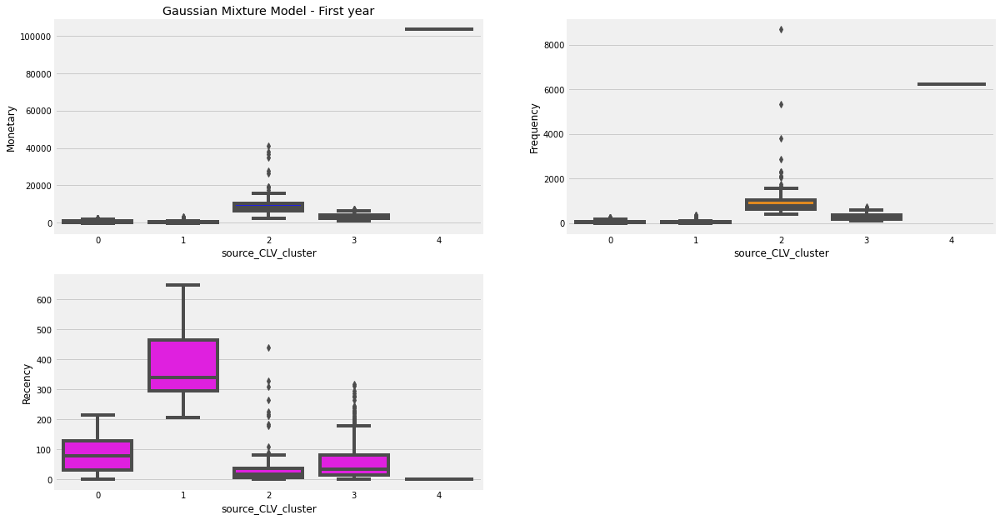

In [27]:
plt.figure(figsize=(18,16))
plt.subplot(3,2,1)
sns.boxplot(x='source_CLV_cluster', y='Monetary', data=df_first_yr_group,color="blue")
plt.title("Gaussian Mixture Model - First year")

plt.subplot(3,2,2)
sns.boxplot(x='source_CLV_cluster', y='Frequency', data=df_first_yr_group,color="darkorange") 

plt.subplot(3,2,3)
sns.boxplot(x='source_CLV_cluster', y='Recency', data=df_first_yr_group,color="fuchsia")

In [28]:
df_first_sec_yr_group = pd.merge(df_first_yr_group, df_sec_yr_group, on='Customer ID', how='left')

In [29]:
df_first_sec_yr_group = df_first_sec_yr_group.fillna(0)

In [30]:
df_first_sec_yr_group.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,3mnth_Revenue
0,12346,341,37,311.37,1,0.00
1,12413,146,22,369.00,0,176.20
2,12426,104,73,1086.86,0,0.00
3,12427,261,8,112.65,1,262.36
4,12437,8,361,5914.65,3,1482.48


In [31]:
# 2. rescaling
rfm_df_sec_temp = df_first_sec_yr_group[['Frequency', 'Recency','3mnth_Revenue']]

# instantiate
scaler = StandardScaler()

# fit_transform
rfm_df_sec_scaled = scaler.fit_transform(rfm_df_sec_temp)
rfm_df_sec_scaled.shape

rfm_df_sec_scaled = pd.DataFrame(rfm_df_sec_temp)
rfm_df_sec_scaled.columns = [ 'Frequency', 'Recency','3mnth_Revenue']
rfm_df_sec_scaled.head()

,Frequency,Recency,3mnth_Revenue
0,37,341,0.00
1,22,146,176.20
2,73,104,0.00
3,8,261,262.36
4,361,8,1482.48


In [32]:
#fit the sec year model
X_Sec = rfm_df_sec_scaled[[ 'Frequency', 'Recency','3mnth_Revenue']].values
                              
gmm_sec = GaussianMixture(n_components=5,covariance_type='spherical').fit(X_Sec)
gmm_sec_labels = gmm_sec.predict(X_Sec)

score = gmm_sec.predict_proba(X_Sec)
rfm_df_sec_scaled['GMM_labels_6m'] = gmm_sec_labels

In [33]:
print(silhouette_score(rfm_df_sec_scaled,gmm_sec_labels))

0.5076835359546178


In [34]:
df_first_sec_yr_group['target_CLV_cluster'] =gmm_sec_labels
df_first_sec_yr_group.head(5)

df_first_sec_yr_group.groupby('target_CLV_cluster')['3mnth_Revenue', 'Frequency', 'Recency'].mean()

,3mnth_Revenue,Frequency,Recency
target_CLV_cluster,,,
0,42.363396,53.623192,245.476165
1,32321.220000,3133.000000,1.000000
2,1290.388057,437.197880,57.579505
3,542.825563,160.067270,90.576973
4,3678.621429,1991.095238,23.571429


In [35]:
df_first_sec_yr_group.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,3mnth_Revenue,target_CLV_cluster
0,12346,341,37,311.37,1,0.00,0
1,12413,146,22,369.00,0,176.20,0
2,12426,104,73,1086.86,0,0.00,0
3,12427,261,8,112.65,1,262.36,0
4,12437,8,361,5914.65,3,1482.48,2


In [36]:
df_first_sec_yr_group.groupby('source_CLV_cluster')['Customer ID'].count()

source_CLV_cluster
0    2004
1    2087
2    115 
3    606 
4    1   
Name: Customer ID, dtype: int64

## Model building

In [37]:
X = df_first_sec_yr_group.drop(['target_CLV_cluster','3mnth_Revenue'],axis=1)
y = df_first_sec_yr_group['target_CLV_cluster']

### XGBOOST

###### Common methods

In [38]:
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Oranges):
   
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
        
    #_________________________________________________
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)
    #_________________________________________________
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black",weight='bold', fontsize=18)
    #_________________________________________________
    plt.tight_layout()
    plt.ylabel('True label',weight='bold', fontsize=18)
    plt.xlabel('Predicted label',weight='bold', fontsize=18)
    
    
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 10)):
   
    """Generate a simple plot of the test and training learning curve"""
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="lime")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="red")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="lime", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="red", label="Cross-validation score")

    plt.legend(loc="best")
    return plt

def model_auc(model): 
    
    train_auc = roc_auc_score(y_train, model.predict_proba(X_train)[:, 1])
    val_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    print(f'Train AUC: {train_auc}, Val Auc: {val_auc}')
    
class Class_Fit(object):
    def __init__(self, clf, params=None):
        if params:            
            
            self.clf = clf(**params)
        else:
           
            self.clf = clf()

    def train(self, x_train, y_train):
        self.clf.fit(x_train, y_train)

    def predict(self, x):
        return self.clf.predict(x)
    
    def grid_search(self, parameters, Kfold):
        self.grid = GridSearchCV(estimator = self.clf, param_grid = parameters, cv = Kfold)
        
    def grid_fit(self, X, Y):
        self.grid.fit(X, Y)
        
    def grid_predict(self, X, Y):
        self.predictions = self.grid.predict(X)
        print("Precision: {:.2f} % ".format(100*metrics.accuracy_score(Y, self.predictions)))  
        
    def train_score(self, X, Y,message):
        print(message.format(self.grid.score(X, Y)))
 
    
    def test_score(self, X, Y,message):
         print(message.format(self.grid.score(X, Y)))
              
      

In [39]:
X.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster
0,12346,341,37,311.37,1
1,12413,146,22,369.00,0
2,12426,104,73,1086.86,0
3,12427,261,8,112.65,1
4,12437,8,361,5914.65,3


In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=101)

In [41]:
X_train.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster
3886,17198,275,63,256.61,1
2620,15727,17,581,6151.01,3
2008,14995,190,35,100.71,0
4774,18245,59,380,4835.69,3
4632,18078,127,60,341.33,0


In [42]:
y_prob = df_first_sec_yr_group["target_CLV_cluster"]
xgb_clf_spec = XGBClassifier( objective="multi:softprob", random_state =123 ,eval_metric='mlogloss')

ltv_xgb_model = GridSearchCV(estimator= xgb_clf_spec,param_grid= dict(learning_rate=[ 0.01,0.1,0.3,0.5] ), \
                             refit= True, cv=5  )

ltv_xgb_model.fit(X,y_prob)


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     eval_metric='mlogloss', gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None,
                                     objective='multi:softprob',
                                     random_state=123, reg_alpha=None,
                      

In [43]:
y_pred = ltv_xgb_model.predict(X_test)
y_pred1 = ltv_xgb_model.predict(X_train)

In [44]:
score_list=[]
from sklearn.metrics import precision_score,recall_score,f1_score,accuracy_score

score_list.append('XGB classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('XGB classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('XGB classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('XGB classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

In [45]:
score_list

['XGB classifier Precision on training set: 0.88 & test data 0.87',
 'XGB classifier Recall    on training set: 0.88 & test data 0.88',
 'XGB classifier F1 score  on training set: 0.87 & test data 0.87',
 'XGB classifier Accuracy  on training set: 0.88 & test data 0.88']

In [46]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.98      0.93      1125
           2       0.95      0.60      0.73        87
           3       0.76      0.50      0.60       226
           4       1.00      1.00      1.00         6

    accuracy                           0.88      1444
   macro avg       0.90      0.77      0.82      1444
weighted avg       0.87      0.88      0.87      1444



In [47]:
print(confusion_matrix(y_test,y_pred))

[[1100    1   24    0]
 [  23   52   12    0]
 [ 112    2  112    0]
 [   0    0    0    6]]


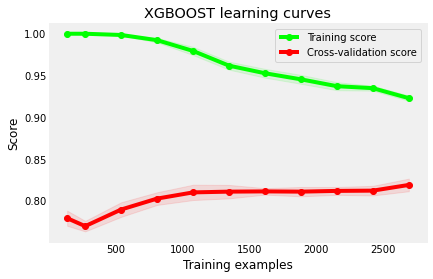

In [48]:

g = plot_learning_curve(ltv_xgb_model.best_estimator_,
                        "XGBOOST learning curves", X_train, y_train, 
                        cv = 5,  train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5,
                                                0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


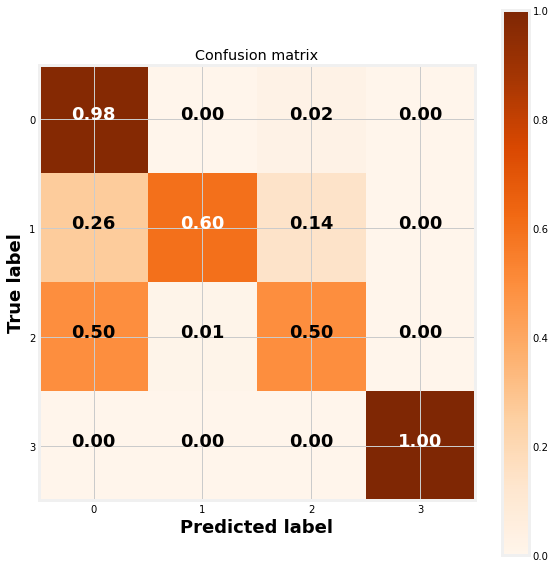

In [49]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=2)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

___
### 5.1 Support Vector Machine Classifier (SVC)

The first classifier I use is the SVC classifier. In order to use it, I create an instance of the `Class_Fit` class and then call` grid_search()`. When calling this method, I provide as parameters:
- the hyperparameters for which I will seek an optimal value
- the number of folds to be used for cross-validation

In [50]:
svc = Class_Fit(clf = svm.LinearSVC)
svc.grid_search(parameters = [{'C':np.logspace(-2,2,10)}], Kfold = 5)

In [51]:
svc.grid_fit(X = X_train, Y = y_train)

In [52]:
svc.grid_predict(X_test, y_test)
y_pred=svc.predictions
svc.grid_predict(X_train, y_train)
y_pred1=svc.predictions

Precision: 80.19 % 
Precision: 80.26 % 


In [53]:
print('Svc classifier Precision on training set: {:.2f} and test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

Svc classifier Precision on training set: 0.66 and test data 0.67


In [54]:
score_list.append('Svc classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('Svc classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('Svc classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('Svc classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))


Normalized confusion matrix


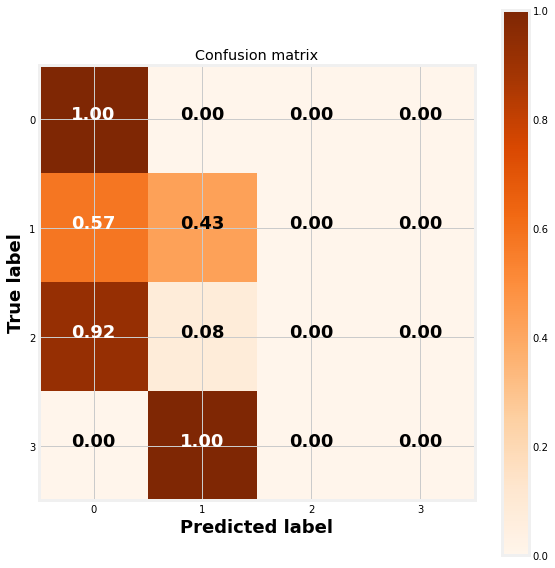

In [55]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=2)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [56]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.81      1.00      0.90      1125
           2       0.58      0.43      0.49        87
           3       0.00      0.00      0.00       226
           4       0.00      0.00      0.00         6

    accuracy                           0.80      1444
   macro avg       0.35      0.36      0.35      1444
weighted avg       0.67      0.80      0.73      1444



In [57]:
print(confusion_matrix(y_test,y_pred))

[[1121    4    0    0]
 [  50   37    0    0]
 [ 209   17    0    0]
 [   0    6    0    0]]


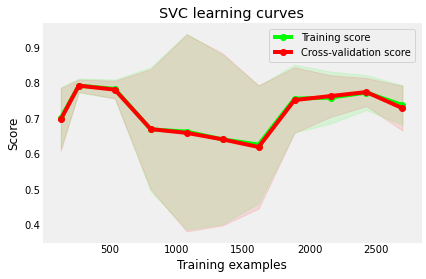

In [58]:
g = plot_learning_curve(svc.grid.best_estimator_,
                        "SVC learning curves", X_train, y_train,  
                        cv = 5,  train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5,0.6, 0.7, 0.8, 0.9, 1])

On this curve, we can see that the train and cross-validation curves converge towards the same limit when the sample size increases. This is typical of modeling with low variance and proves that the model does not suffer from overfitting. Also, we can see that the accuracy of the training curve is correct which is synonymous of a low bias. Hence the model does not underfit the data.

___
### 5.2 Logistic Regression

I now consider the logistic regression classifier. As before, I create an instance of the `Class_Fit` class, adjust the model on the training data and see how the predictions compare to the real values:

In [59]:
lr = Class_Fit(clf = linear_model.LogisticRegression)
lr.grid_search(parameters = [{'C':np.logspace(-2,2,20)}], Kfold = 5)
lr.grid_fit(X = X_train, Y = y_train)
lr.grid_predict(X_test, y_test)

Precision: 81.93 % 


In [60]:
lr.grid_predict(X_test, y_test)
y_pred=lr.predictions
lr.grid_predict(X_train, y_train)
y_pred1=lr.predictions


score_list.append('LR classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('LR classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('LR classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('LR classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))


Precision: 81.93 % 
Precision: 82.58 % 


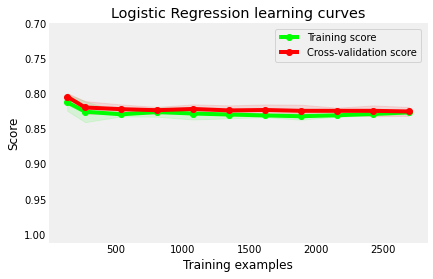

In [61]:
g = plot_learning_curve(lr.grid.best_estimator_, "Logistic Regression learning curves", X_train, y_train,
                        ylim = [1.01, 0.7], cv = 5, 
                        train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


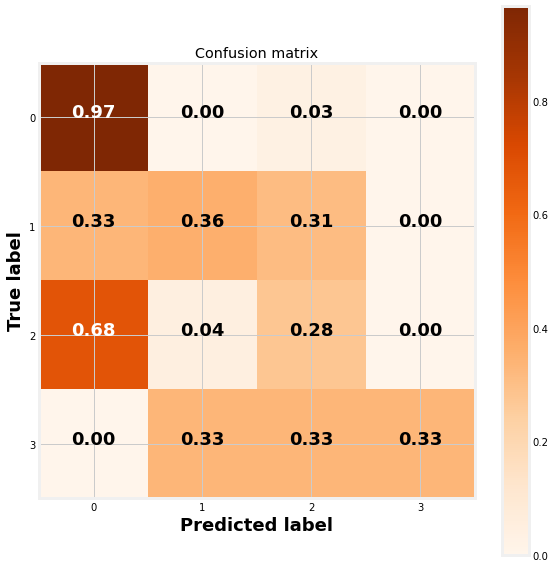

In [62]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=2)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [63]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.97      0.91      1125
           2       0.69      0.36      0.47        87
           3       0.49      0.28      0.36       226
           4       1.00      0.33      0.50         6

    accuracy                           0.82      1444
   macro avg       0.76      0.48      0.56      1444
weighted avg       0.79      0.82      0.79      1444



In [64]:
print(confusion_matrix(y_test,y_pred))

[[1087    2   36    0]
 [  29   31   27    0]
 [ 153   10   63    0]
 [   0    2    2    2]]


### 5.4 Decision Tree

In [65]:
tr = Class_Fit(clf = tree.DecisionTreeClassifier)
tr.grid_search(parameters = [{'criterion' : ['entropy', 'gini'], 'max_features' :['sqrt', 'log2']}], Kfold =5)
tr.grid_fit(X = X_train, Y = y_train)
tr.grid_predict(X_test, y_test)

Precision: 72.44 % 


In [66]:
tr.grid_predict(X_test, y_test)
y_pred=tr.predictions
tr.grid_predict(X_train, y_train)
y_pred1=tr.predictions

 
score_list.append('DT classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('DT classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('DT classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('DT classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

Precision: 72.44 % 
Precision: 100.00 % 


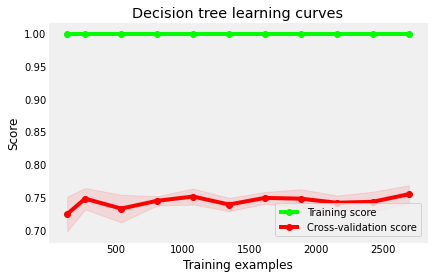

In [67]:
g = plot_learning_curve(tr.grid.best_estimator_, "Decision tree learning curves", X_train,y_train,
                          cv = 5, 
                        train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


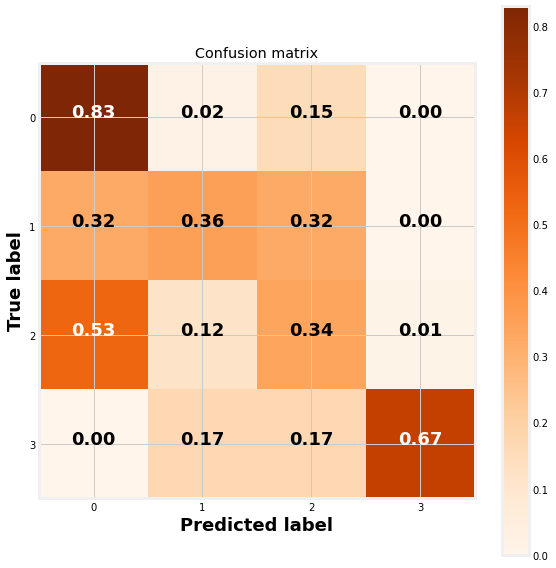

In [68]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=2)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [69]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.83      0.85      1125
           2       0.40      0.36      0.38        87
           3       0.28      0.34      0.31       226
           4       0.50      0.67      0.57         6

    accuracy                           0.72      1444
   macro avg       0.51      0.55      0.53      1444
weighted avg       0.74      0.72      0.73      1444



In [70]:
print(confusion_matrix(y_test,y_pred))

[[934  19 171   1]
 [ 28  31  28   0]
 [119  27  77   3]
 [  0   1   1   4]]


### 5.5 Random Forest

In [71]:
rf = Class_Fit(clf = ensemble.RandomForestClassifier)
param_grid = {'criterion' : ['entropy', 'gini'], 'n_estimators' : [20, 40, 60, 80, 100],
               'max_features' :['sqrt', 'log2']}
rf.grid_search(parameters = param_grid, Kfold = 5)
rf.grid_fit(X = X_train, Y = y_train)
rf.grid_predict(X_test, y_test)

Precision: 80.68 % 


In [72]:
rf.grid_predict(X_train, y_train)

Precision: 100.00 % 


In [73]:
rf.grid_predict(X_test, y_test)
y_pred=rf.predictions
rf.grid_predict(X_train, y_train)
y_pred1=rf.predictions
 
score_list.append('RF classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('RF classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('RF classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('RF classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

Precision: 80.68 % 
Precision: 100.00 % 


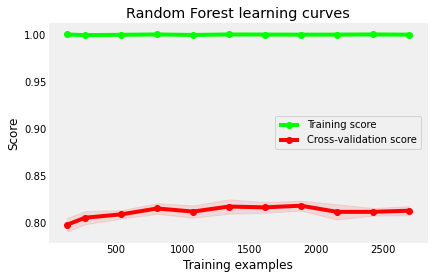

In [74]:
g = plot_learning_curve(rf.grid.best_estimator_, "Random Forest learning curves", X_train, y_train,
                         cv = 5, 
                        train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


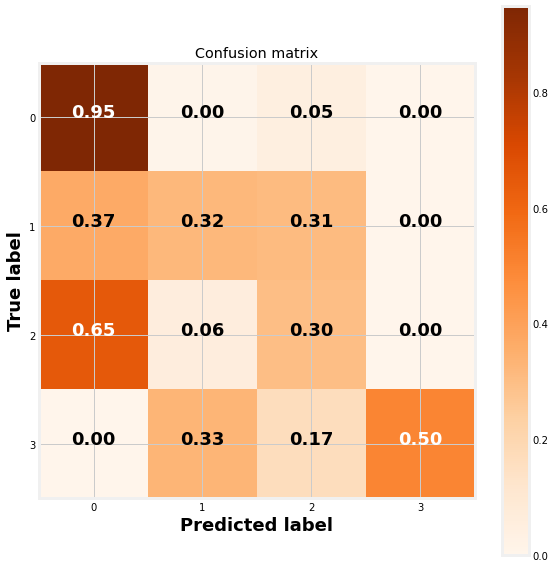

In [75]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=2)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [76]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.95      0.90      1125
           2       0.58      0.32      0.41        87
           3       0.45      0.30      0.36       226
           4       1.00      0.50      0.67         6

    accuracy                           0.81      1444
   macro avg       0.72      0.52      0.59      1444
weighted avg       0.78      0.81      0.79      1444



In [77]:
print(confusion_matrix(y_test,y_pred))

[[1067    5   53    0]
 [  32   28   27    0]
 [ 146   13   67    0]
 [   0    2    1    3]]


### 5.6 AdaBoost Classifier

In [78]:
ada = Class_Fit(clf = AdaBoostClassifier)
param_grid = {'n_estimators' : [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}
ada.grid_search(parameters = param_grid, Kfold = 5)
ada.grid_fit(X = X_train, Y = y_train)
ada.grid_predict(X_test,y_test)

Precision: 79.85 % 


In [79]:
ada.grid_predict(X_test, y_test)
y_pred=ada.predictions
ada.grid_predict(X_train, y_train)
y_pred1=ada.predictions

 
score_list.append('Adabost classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('Adabost classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('Adabost classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('Adabost classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

Precision: 79.85 % 
Precision: 79.43 % 


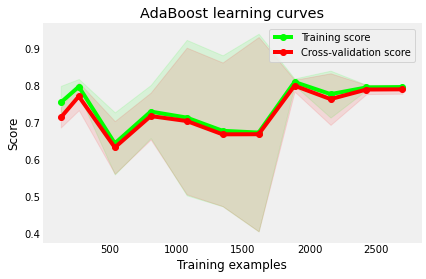

In [80]:
g = plot_learning_curve(ada.grid.best_estimator_, "AdaBoost learning curves", X_train, y_train,
                       cv = 5, train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


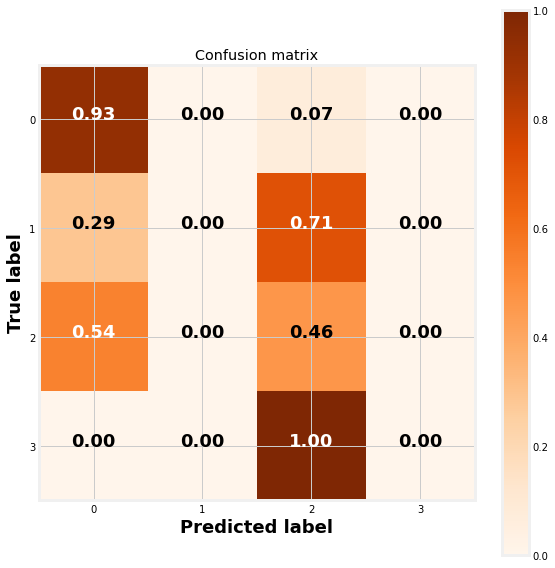

In [81]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=2)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [82]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.88      0.93      0.90      1125
           2       0.00      0.00      0.00        87
           3       0.42      0.46      0.44       226
           4       0.00      0.00      0.00         6

    accuracy                           0.80      1444
   macro avg       0.32      0.35      0.34      1444
weighted avg       0.75      0.80      0.77      1444



In [83]:
print(confusion_matrix(y_test,y_pred))

[[1048    0   77    0]
 [  25    0   62    0]
 [ 121    0  105    0]
 [   0    0    6    0]]


### 5.7 Gradient Boosting Classifier

In [84]:
gb = Class_Fit(clf = ensemble.GradientBoostingClassifier)
param_grid = {'n_estimators' : [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}
gb.grid_search(parameters = param_grid, Kfold = 5)
gb.grid_fit(X = X_train, Y = y_train)
gb.grid_predict(X_test, y_test)

Precision: 82.13 % 


In [85]:
gb.grid_predict(X_test, y_test)
y_pred=gb.predictions
gb.grid_predict(X_train, y_train)
y_pred1=gb.predictions
 
score_list.append('GB classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('GB classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('GB classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('GB classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

Precision: 82.13 % 
Precision: 84.03 % 


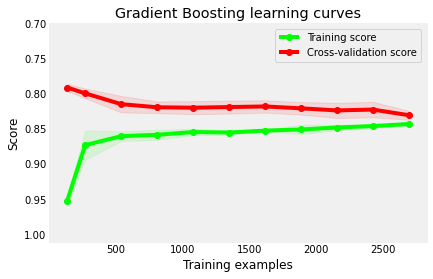

In [86]:
g = plot_learning_curve(gb.grid.best_estimator_, "Gradient Boosting learning curves", X_train, y_train,
                        ylim = [1.01, 0.7], cv = 5, 
                        train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


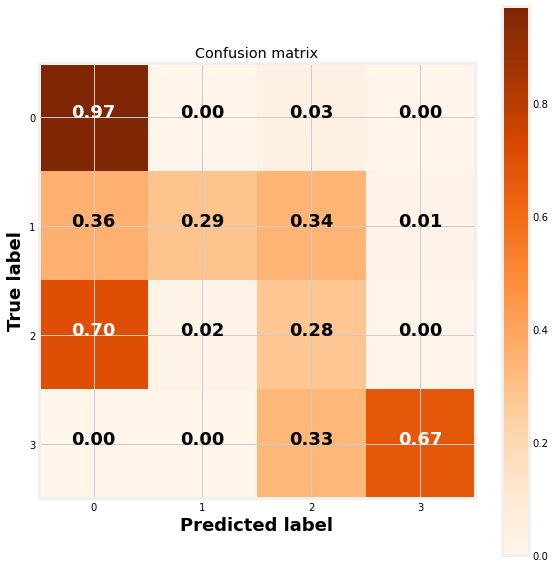

In [87]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=1)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [88]:
print (classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.85      0.97      0.91      1125
           2       0.83      0.29      0.43        87
           3       0.50      0.28      0.36       226
           4       0.67      0.67      0.67         6

    accuracy                           0.82      1444
   macro avg       0.71      0.55      0.59      1444
weighted avg       0.80      0.82      0.79      1444



In [89]:
print(confusion_matrix(y_test,y_pred))

[[1094    1   30    0]
 [  31   25   30    1]
 [ 158    4   63    1]
 [   0    0    2    4]]


### 5.3 k-Nearest Neighbors

In [90]:

from sklearn import neighbors, linear_model, svm, tree, ensemble


knn = Class_Fit(clf = neighbors.KNeighborsClassifier)
knn.grid_search(parameters = [{'n_neighbors': np.arange(1,50,1)}], Kfold = 5)
knn.grid_fit(X = X_train, Y = y_train)
knn.grid_predict(X_test, y_test)

Precision: 81.09 % 


In [91]:
knn.grid_predict(X_test, y_test)
y_pred=knn.predictions
knn.grid_predict(X_train, y_train)
y_pred1=knn.predictions

 
score_list.append('knn classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('knn classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('knn classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('knn classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

Precision: 81.09 % 
Precision: 81.89 % 


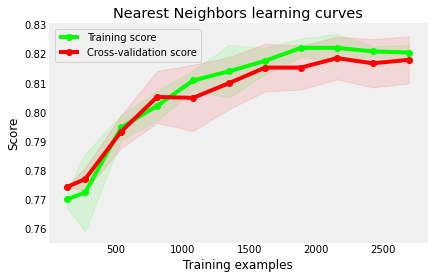

In [92]:
g = plot_learning_curve(knn.grid.best_estimator_, "Nearest Neighbors learning curves", X_train, y_train,
                       cv = 5, 
                        train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


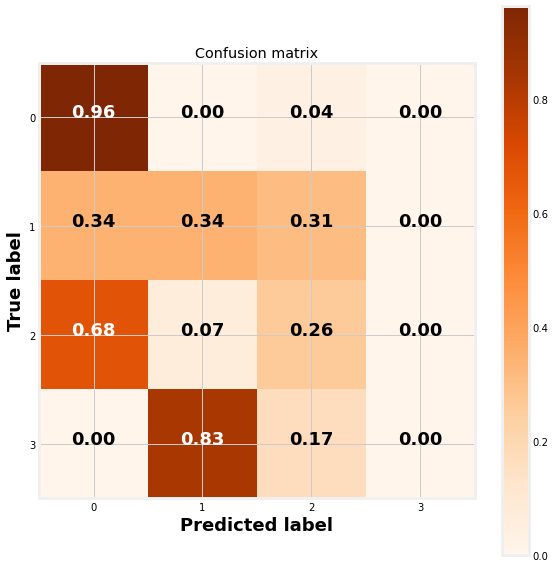

In [93]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=1)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [94]:
print (classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.96      0.91      1125
           2       0.59      0.34      0.43        87
           3       0.46      0.26      0.33       226
           4       0.00      0.00      0.00         6

    accuracy                           0.81      1444
   macro avg       0.48      0.39      0.42      1444
weighted avg       0.77      0.81      0.78      1444



In [95]:
print(confusion_matrix(y_test,y_pred))

[[1083    1   41    0]
 [  30   30   27    0]
 [ 153   15   58    0]
 [   0    5    1    0]]


### 5.3 Light BM

In [96]:
# build the lightgbm model

lbm = Class_Fit(clf = lgb.LGBMClassifier)
param_grid = {'learning_rate':[0.1],'num_leaves':[31],'n_estimators' : [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}

lbm.grid_search(parameters = param_grid, Kfold = 5)
lbm.grid_fit(X = X_train, Y = y_train)
lbm.grid_predict(X_test,y_test)

Precision: 81.79 % 


In [97]:
lbm.grid_predict(X_test, y_test)
y_pred=lbm.predictions
lbm.grid_predict(X_train, y_train)
y_pred1=lbm.predictions

score_list.append('Light BM  classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('Light BM  classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('Light BM  classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('Light BM  classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

Precision: 81.79 % 
Precision: 85.37 % 


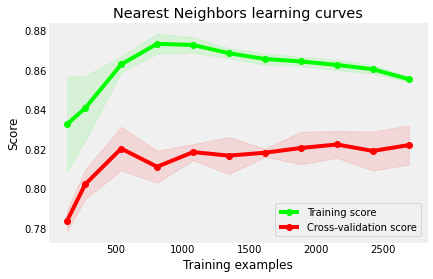

In [98]:
g = plot_learning_curve(lbm.grid.best_estimator_, "Nearest Neighbors learning curves", X_train, y_train,
                         cv = 5, 
                        train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


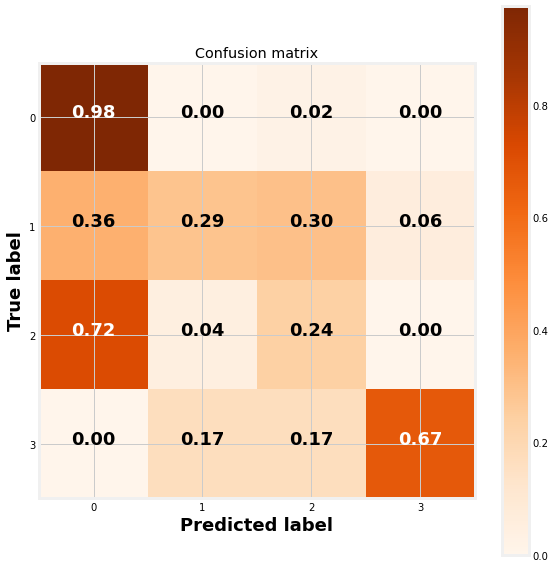

In [99]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=1)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [100]:

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.98      0.91      1125
           2       0.66      0.29      0.40        87
           3       0.51      0.24      0.33       226
           4       0.44      0.67      0.53         6

    accuracy                           0.82      1444
   macro avg       0.62      0.54      0.54      1444
weighted avg       0.78      0.82      0.79      1444



In [101]:
print(confusion_matrix(y_test,y_pred))

[[1098    2   25    0]
 [  31   25   26    5]
 [ 162   10   54    0]
 [   0    1    1    4]]


### 5.4 Catboost

In [102]:
catb = Class_Fit(clf =CatBoostClassifier)
param_grid = {'n_estimators' : [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}

catb.grid_search(parameters = param_grid, Kfold = 5)
catb.grid_fit(X = X_train, Y = y_train)
catb.grid_predict(X_test,y_test)

Learning rate set to 0.5
0:	learn: 0.7364036	total: 58.9ms	remaining: 530ms
1:	learn: 0.6038817	total: 63.3ms	remaining: 253ms
2:	learn: 0.5364166	total: 67.8ms	remaining: 158ms
3:	learn: 0.4960904	total: 71.9ms	remaining: 108ms
4:	learn: 0.4719077	total: 76.1ms	remaining: 76.1ms
5:	learn: 0.4555017	total: 81.1ms	remaining: 54.1ms
6:	learn: 0.4463232	total: 85.4ms	remaining: 36.6ms
7:	learn: 0.4371287	total: 89.4ms	remaining: 22.3ms
8:	learn: 0.4314665	total: 93.4ms	remaining: 10.4ms
9:	learn: 0.4257621	total: 98.4ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.7390917	total: 6.75ms	remaining: 60.7ms
1:	learn: 0.6101173	total: 10.9ms	remaining: 43.5ms
2:	learn: 0.5421631	total: 15.4ms	remaining: 35.8ms
3:	learn: 0.5033512	total: 19.4ms	remaining: 29.1ms
4:	learn: 0.4802889	total: 22.4ms	remaining: 22.4ms
5:	learn: 0.4641156	total: 26.4ms	remaining: 17.6ms
6:	learn: 0.4530620	total: 30.7ms	remaining: 13.2ms
7:	learn: 0.4435482	total: 35.9ms	remaining: 8.99ms
8:	learn: 0.4385491	t

9:	learn: 0.4257621	total: 45.4ms	remaining: 90.8ms
10:	learn: 0.4181962	total: 49.6ms	remaining: 85.6ms
11:	learn: 0.4142230	total: 54.1ms	remaining: 81.1ms
12:	learn: 0.4095307	total: 58.4ms	remaining: 76.4ms
13:	learn: 0.4047071	total: 62.5ms	remaining: 71.4ms
14:	learn: 0.4011560	total: 66.4ms	remaining: 66.4ms
15:	learn: 0.3983160	total: 71.3ms	remaining: 62.3ms
16:	learn: 0.3954950	total: 75.4ms	remaining: 57.7ms
17:	learn: 0.3925305	total: 79.4ms	remaining: 52.9ms
18:	learn: 0.3901343	total: 83.5ms	remaining: 48.3ms
19:	learn: 0.3882370	total: 87.8ms	remaining: 43.9ms
20:	learn: 0.3849651	total: 92ms	remaining: 39.4ms
21:	learn: 0.3818329	total: 96.2ms	remaining: 35ms
22:	learn: 0.3800061	total: 100ms	remaining: 30.4ms
23:	learn: 0.3759048	total: 105ms	remaining: 26.1ms
24:	learn: 0.3725008	total: 109ms	remaining: 21.8ms
25:	learn: 0.3692601	total: 113ms	remaining: 17.4ms
26:	learn: 0.3665857	total: 118ms	remaining: 13.1ms
27:	learn: 0.3657414	total: 122ms	remaining: 8.7ms
28:	l

19:	learn: 0.3882370	total: 87.5ms	remaining: 87.5ms
20:	learn: 0.3849651	total: 91.9ms	remaining: 83.1ms
21:	learn: 0.3818329	total: 95.8ms	remaining: 78.4ms
22:	learn: 0.3800061	total: 100ms	remaining: 74.2ms
23:	learn: 0.3759048	total: 104ms	remaining: 69.6ms
24:	learn: 0.3725008	total: 109ms	remaining: 65.1ms
25:	learn: 0.3692601	total: 113ms	remaining: 60.6ms
26:	learn: 0.3665857	total: 117ms	remaining: 56.3ms
27:	learn: 0.3657414	total: 121ms	remaining: 51.7ms
28:	learn: 0.3623768	total: 124ms	remaining: 47.2ms
29:	learn: 0.3597080	total: 129ms	remaining: 43.1ms
30:	learn: 0.3576489	total: 134ms	remaining: 38.8ms
31:	learn: 0.3547088	total: 138ms	remaining: 34.4ms
32:	learn: 0.3513270	total: 141ms	remaining: 30ms
33:	learn: 0.3500829	total: 146ms	remaining: 25.8ms
34:	learn: 0.3479161	total: 150ms	remaining: 21.5ms
35:	learn: 0.3450028	total: 155ms	remaining: 17.2ms
36:	learn: 0.3429185	total: 159ms	remaining: 12.9ms
37:	learn: 0.3414751	total: 164ms	remaining: 8.63ms
38:	learn: 

21:	learn: 0.3842715	total: 97.4ms	remaining: 79.7ms
22:	learn: 0.3818674	total: 102ms	remaining: 75.4ms
23:	learn: 0.3789204	total: 106ms	remaining: 70.9ms
24:	learn: 0.3766591	total: 110ms	remaining: 66.1ms
25:	learn: 0.3743680	total: 115ms	remaining: 61.8ms
26:	learn: 0.3704141	total: 119ms	remaining: 57.4ms
27:	learn: 0.3676238	total: 123ms	remaining: 52.7ms
28:	learn: 0.3639249	total: 127ms	remaining: 48.3ms
29:	learn: 0.3610312	total: 131ms	remaining: 43.8ms
30:	learn: 0.3581873	total: 136ms	remaining: 39.4ms
31:	learn: 0.3561358	total: 140ms	remaining: 34.9ms
32:	learn: 0.3528748	total: 144ms	remaining: 30.5ms
33:	learn: 0.3513484	total: 148ms	remaining: 26.1ms
34:	learn: 0.3488318	total: 152ms	remaining: 21.8ms
35:	learn: 0.3471943	total: 156ms	remaining: 17.4ms
36:	learn: 0.3456757	total: 160ms	remaining: 13ms
37:	learn: 0.3439436	total: 164ms	remaining: 8.64ms
38:	learn: 0.3421559	total: 168ms	remaining: 4.32ms
39:	learn: 0.3398608	total: 172ms	remaining: 0us
Learning rate se

39:	learn: 0.3447070	total: 171ms	remaining: 42.8ms
40:	learn: 0.3421952	total: 175ms	remaining: 38.5ms
41:	learn: 0.3396579	total: 180ms	remaining: 34.3ms
42:	learn: 0.3365912	total: 184ms	remaining: 30ms
43:	learn: 0.3351665	total: 188ms	remaining: 25.7ms
44:	learn: 0.3342314	total: 193ms	remaining: 21.4ms
45:	learn: 0.3318601	total: 197ms	remaining: 17.1ms
46:	learn: 0.3300528	total: 201ms	remaining: 12.8ms
47:	learn: 0.3276273	total: 205ms	remaining: 8.53ms
48:	learn: 0.3259159	total: 209ms	remaining: 4.26ms
49:	learn: 0.3250809	total: 213ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.7326003	total: 4.92ms	remaining: 241ms
1:	learn: 0.6000086	total: 9.15ms	remaining: 220ms
2:	learn: 0.5336890	total: 13.8ms	remaining: 217ms
3:	learn: 0.4966525	total: 18ms	remaining: 208ms
4:	learn: 0.4733281	total: 20.8ms	remaining: 187ms
5:	learn: 0.4607274	total: 25ms	remaining: 184ms
6:	learn: 0.4492173	total: 29.9ms	remaining: 184ms
7:	learn: 0.4420696	total: 34.1ms	remaining: 179ms
8:	l

1:	learn: 0.6101173	total: 11ms	remaining: 319ms
2:	learn: 0.5421631	total: 15.1ms	remaining: 287ms
3:	learn: 0.5033512	total: 19.3ms	remaining: 270ms
4:	learn: 0.4802889	total: 22.3ms	remaining: 245ms
5:	learn: 0.4641156	total: 26.4ms	remaining: 238ms
6:	learn: 0.4530620	total: 30.4ms	remaining: 230ms
7:	learn: 0.4435482	total: 34.9ms	remaining: 227ms
8:	learn: 0.4385491	total: 39ms	remaining: 221ms
9:	learn: 0.4327706	total: 43.2ms	remaining: 216ms
10:	learn: 0.4267713	total: 47.5ms	remaining: 212ms
11:	learn: 0.4226828	total: 52.1ms	remaining: 208ms
12:	learn: 0.4189711	total: 56.2ms	remaining: 203ms
13:	learn: 0.4163017	total: 60.1ms	remaining: 198ms
14:	learn: 0.4126462	total: 64.9ms	remaining: 195ms
15:	learn: 0.4101216	total: 69.5ms	remaining: 191ms
16:	learn: 0.4078648	total: 73.8ms	remaining: 187ms
17:	learn: 0.4047429	total: 78ms	remaining: 182ms
18:	learn: 0.4012812	total: 82.6ms	remaining: 178ms
19:	learn: 0.3989499	total: 86.6ms	remaining: 173ms
20:	learn: 0.3961680	total:

52:	learn: 0.3143032	total: 242ms	remaining: 31.9ms
53:	learn: 0.3126252	total: 246ms	remaining: 27.3ms
54:	learn: 0.3105179	total: 250ms	remaining: 22.7ms
55:	learn: 0.3088212	total: 254ms	remaining: 18.1ms
56:	learn: 0.3068212	total: 258ms	remaining: 13.6ms
57:	learn: 0.3047535	total: 262ms	remaining: 9.03ms
58:	learn: 0.3038054	total: 266ms	remaining: 4.51ms
59:	learn: 0.3015410	total: 270ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.7316779	total: 6.74ms	remaining: 398ms
1:	learn: 0.6016761	total: 9.67ms	remaining: 281ms
2:	learn: 0.5366652	total: 14ms	remaining: 265ms
3:	learn: 0.4994563	total: 18.6ms	remaining: 260ms
4:	learn: 0.4738039	total: 22.9ms	remaining: 252ms
5:	learn: 0.4577046	total: 27.1ms	remaining: 244ms
6:	learn: 0.4472011	total: 31.2ms	remaining: 236ms
7:	learn: 0.4404523	total: 35.5ms	remaining: 231ms
8:	learn: 0.4344455	total: 39.7ms	remaining: 225ms
9:	learn: 0.4294201	total: 43.7ms	remaining: 218ms
10:	learn: 0.4234831	total: 47.8ms	remaining: 213ms
11

42:	learn: 0.3330343	total: 190ms	remaining: 120ms
43:	learn: 0.3308155	total: 195ms	remaining: 115ms
44:	learn: 0.3286832	total: 200ms	remaining: 111ms
45:	learn: 0.3272990	total: 204ms	remaining: 107ms
46:	learn: 0.3259752	total: 209ms	remaining: 102ms
47:	learn: 0.3230421	total: 213ms	remaining: 97.7ms
48:	learn: 0.3205007	total: 217ms	remaining: 93.2ms
49:	learn: 0.3185578	total: 221ms	remaining: 88.6ms
50:	learn: 0.3170146	total: 225ms	remaining: 84ms
51:	learn: 0.3150609	total: 230ms	remaining: 79.7ms
52:	learn: 0.3131178	total: 235ms	remaining: 75.2ms
53:	learn: 0.3124287	total: 239ms	remaining: 70.7ms
54:	learn: 0.3111842	total: 243ms	remaining: 66.3ms
55:	learn: 0.3097708	total: 248ms	remaining: 61.9ms
56:	learn: 0.3080711	total: 252ms	remaining: 57.5ms
57:	learn: 0.3070102	total: 256ms	remaining: 52.9ms
58:	learn: 0.3049249	total: 261ms	remaining: 48.6ms
59:	learn: 0.3041244	total: 265ms	remaining: 44.2ms
60:	learn: 0.3020816	total: 269ms	remaining: 39.7ms
61:	learn: 0.301088

69:	learn: 0.2857141	total: 298ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.7316779	total: 5.81ms	remaining: 401ms
1:	learn: 0.6016761	total: 8.79ms	remaining: 299ms
2:	learn: 0.5366652	total: 13.7ms	remaining: 306ms
3:	learn: 0.4994563	total: 18.1ms	remaining: 299ms
4:	learn: 0.4738039	total: 22.1ms	remaining: 288ms
5:	learn: 0.4577046	total: 27.4ms	remaining: 293ms
6:	learn: 0.4472011	total: 31.5ms	remaining: 284ms
7:	learn: 0.4404523	total: 35.7ms	remaining: 276ms
8:	learn: 0.4344455	total: 39.7ms	remaining: 269ms
9:	learn: 0.4294201	total: 44ms	remaining: 264ms
10:	learn: 0.4234831	total: 48.1ms	remaining: 258ms
11:	learn: 0.4192295	total: 52.1ms	remaining: 252ms
12:	learn: 0.4131524	total: 56.9ms	remaining: 249ms
13:	learn: 0.4086654	total: 61.5ms	remaining: 246ms
14:	learn: 0.4050872	total: 66.3ms	remaining: 243ms
15:	learn: 0.4020212	total: 71ms	remaining: 240ms
16:	learn: 0.3992585	total: 75.8ms	remaining: 236ms
17:	learn: 0.3950455	total: 80ms	remaining: 231ms
18:	le

15:	learn: 0.4101216	total: 68.1ms	remaining: 272ms
16:	learn: 0.4078648	total: 72.9ms	remaining: 270ms
17:	learn: 0.4047429	total: 76.9ms	remaining: 265ms
18:	learn: 0.4012812	total: 81.1ms	remaining: 260ms
19:	learn: 0.3989499	total: 85.2ms	remaining: 255ms
20:	learn: 0.3961680	total: 89.9ms	remaining: 253ms
21:	learn: 0.3903570	total: 93.9ms	remaining: 248ms
22:	learn: 0.3876777	total: 97.6ms	remaining: 242ms
23:	learn: 0.3832935	total: 102ms	remaining: 237ms
24:	learn: 0.3807420	total: 106ms	remaining: 233ms
25:	learn: 0.3776838	total: 110ms	remaining: 228ms
26:	learn: 0.3748729	total: 114ms	remaining: 223ms
27:	learn: 0.3716083	total: 118ms	remaining: 220ms
28:	learn: 0.3674804	total: 123ms	remaining: 216ms
29:	learn: 0.3644805	total: 127ms	remaining: 211ms
30:	learn: 0.3620751	total: 131ms	remaining: 207ms
31:	learn: 0.3594464	total: 135ms	remaining: 203ms
32:	learn: 0.3570911	total: 140ms	remaining: 199ms
33:	learn: 0.3539931	total: 144ms	remaining: 195ms
34:	learn: 0.3521446	to

24:	learn: 0.3742556	total: 107ms	remaining: 234ms
25:	learn: 0.3712502	total: 111ms	remaining: 230ms
26:	learn: 0.3691615	total: 116ms	remaining: 227ms
27:	learn: 0.3650784	total: 120ms	remaining: 223ms
28:	learn: 0.3632752	total: 125ms	remaining: 219ms
29:	learn: 0.3597276	total: 129ms	remaining: 216ms
30:	learn: 0.3565581	total: 134ms	remaining: 212ms
31:	learn: 0.3552487	total: 138ms	remaining: 207ms
32:	learn: 0.3531619	total: 142ms	remaining: 202ms
33:	learn: 0.3499505	total: 146ms	remaining: 198ms
34:	learn: 0.3477157	total: 151ms	remaining: 194ms
35:	learn: 0.3455676	total: 155ms	remaining: 189ms
36:	learn: 0.3435701	total: 159ms	remaining: 185ms
37:	learn: 0.3411797	total: 164ms	remaining: 181ms
38:	learn: 0.3401805	total: 168ms	remaining: 177ms
39:	learn: 0.3380276	total: 172ms	remaining: 172ms
40:	learn: 0.3356282	total: 176ms	remaining: 167ms
41:	learn: 0.3347381	total: 181ms	remaining: 164ms
42:	learn: 0.3328830	total: 185ms	remaining: 159ms
43:	learn: 0.3311655	total: 189

39:	learn: 0.3361394	total: 169ms	remaining: 211ms
40:	learn: 0.3333086	total: 173ms	remaining: 207ms
41:	learn: 0.3311336	total: 177ms	remaining: 203ms
42:	learn: 0.3284340	total: 182ms	remaining: 198ms
43:	learn: 0.3272829	total: 186ms	remaining: 194ms
44:	learn: 0.3259863	total: 190ms	remaining: 190ms
45:	learn: 0.3246272	total: 194ms	remaining: 185ms
46:	learn: 0.3220281	total: 198ms	remaining: 181ms
47:	learn: 0.3198736	total: 202ms	remaining: 177ms
48:	learn: 0.3184999	total: 206ms	remaining: 173ms
49:	learn: 0.3173909	total: 210ms	remaining: 168ms
50:	learn: 0.3145737	total: 215ms	remaining: 164ms
51:	learn: 0.3121379	total: 219ms	remaining: 160ms
52:	learn: 0.3093554	total: 223ms	remaining: 156ms
53:	learn: 0.3071781	total: 227ms	remaining: 151ms
54:	learn: 0.3059780	total: 231ms	remaining: 147ms
55:	learn: 0.3036847	total: 235ms	remaining: 143ms
56:	learn: 0.3011916	total: 239ms	remaining: 139ms
57:	learn: 0.2998598	total: 244ms	remaining: 135ms
58:	learn: 0.2979006	total: 248

24:	learn: 0.3772527	total: 110ms	remaining: 286ms
25:	learn: 0.3751006	total: 115ms	remaining: 283ms
26:	learn: 0.3734707	total: 119ms	remaining: 278ms
27:	learn: 0.3708080	total: 123ms	remaining: 273ms
28:	learn: 0.3682683	total: 128ms	remaining: 269ms
29:	learn: 0.3657275	total: 133ms	remaining: 265ms
30:	learn: 0.3634704	total: 137ms	remaining: 260ms
31:	learn: 0.3598987	total: 141ms	remaining: 256ms
32:	learn: 0.3581762	total: 146ms	remaining: 252ms
33:	learn: 0.3562247	total: 150ms	remaining: 247ms
34:	learn: 0.3543140	total: 154ms	remaining: 242ms
35:	learn: 0.3527457	total: 158ms	remaining: 237ms
36:	learn: 0.3513193	total: 163ms	remaining: 233ms
37:	learn: 0.3491633	total: 167ms	remaining: 229ms
38:	learn: 0.3466150	total: 172ms	remaining: 225ms
39:	learn: 0.3447070	total: 177ms	remaining: 221ms
40:	learn: 0.3421952	total: 181ms	remaining: 217ms
41:	learn: 0.3396579	total: 186ms	remaining: 212ms
42:	learn: 0.3365912	total: 190ms	remaining: 208ms
43:	learn: 0.3351665	total: 195

7:	learn: 0.4404523	total: 35.1ms	remaining: 360ms
8:	learn: 0.4344455	total: 39.4ms	remaining: 354ms
9:	learn: 0.4294201	total: 44.2ms	remaining: 353ms
10:	learn: 0.4234831	total: 48.8ms	remaining: 351ms
11:	learn: 0.4192295	total: 53.3ms	remaining: 347ms
12:	learn: 0.4131524	total: 58ms	remaining: 344ms
13:	learn: 0.4086654	total: 62.8ms	remaining: 341ms
14:	learn: 0.4050872	total: 67.5ms	remaining: 338ms
15:	learn: 0.4020212	total: 71.8ms	remaining: 332ms
16:	learn: 0.3992585	total: 76.1ms	remaining: 327ms
17:	learn: 0.3950455	total: 80.4ms	remaining: 322ms
18:	learn: 0.3920156	total: 84.8ms	remaining: 317ms
19:	learn: 0.3882031	total: 89.3ms	remaining: 312ms
20:	learn: 0.3868264	total: 94.1ms	remaining: 309ms
21:	learn: 0.3842715	total: 98.7ms	remaining: 305ms
22:	learn: 0.3818674	total: 103ms	remaining: 300ms
23:	learn: 0.3789204	total: 108ms	remaining: 296ms
24:	learn: 0.3766591	total: 112ms	remaining: 292ms
25:	learn: 0.3743680	total: 116ms	remaining: 287ms
26:	learn: 0.3704141	

90:	learn: 0.2484435	total: 390ms	remaining: 38.6ms
91:	learn: 0.2475004	total: 394ms	remaining: 34.3ms
92:	learn: 0.2456642	total: 398ms	remaining: 30ms
93:	learn: 0.2444720	total: 403ms	remaining: 25.7ms
94:	learn: 0.2432038	total: 407ms	remaining: 21.4ms
95:	learn: 0.2420312	total: 411ms	remaining: 17.1ms
96:	learn: 0.2413873	total: 415ms	remaining: 12.8ms
97:	learn: 0.2408132	total: 420ms	remaining: 8.58ms
98:	learn: 0.2395298	total: 424ms	remaining: 4.29ms
99:	learn: 0.2379830	total: 428ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.7390917	total: 5.8ms	remaining: 574ms
1:	learn: 0.6101173	total: 9.58ms	remaining: 469ms
2:	learn: 0.5421631	total: 13.3ms	remaining: 428ms
3:	learn: 0.5033512	total: 17.1ms	remaining: 410ms
4:	learn: 0.4802889	total: 19.9ms	remaining: 377ms
5:	learn: 0.4641156	total: 24.8ms	remaining: 388ms
6:	learn: 0.4530620	total: 28.7ms	remaining: 381ms
7:	learn: 0.4435482	total: 33.1ms	remaining: 381ms
8:	learn: 0.4385491	total: 37.5ms	remaining: 379ms
9:

69:	learn: 0.2906765	total: 300ms	remaining: 129ms
70:	learn: 0.2902414	total: 304ms	remaining: 124ms
71:	learn: 0.2886438	total: 308ms	remaining: 120ms
72:	learn: 0.2869234	total: 313ms	remaining: 116ms
73:	learn: 0.2859610	total: 317ms	remaining: 111ms
74:	learn: 0.2852853	total: 321ms	remaining: 107ms
75:	learn: 0.2846658	total: 325ms	remaining: 103ms
76:	learn: 0.2830621	total: 329ms	remaining: 98.3ms
77:	learn: 0.2818599	total: 333ms	remaining: 94ms
78:	learn: 0.2806850	total: 338ms	remaining: 89.8ms
79:	learn: 0.2801743	total: 342ms	remaining: 85.5ms
80:	learn: 0.2793406	total: 346ms	remaining: 81.1ms
81:	learn: 0.2778396	total: 350ms	remaining: 76.8ms
82:	learn: 0.2758810	total: 354ms	remaining: 72.6ms
83:	learn: 0.2748878	total: 358ms	remaining: 68.3ms
84:	learn: 0.2723328	total: 362ms	remaining: 63.9ms
85:	learn: 0.2715204	total: 366ms	remaining: 59.6ms
86:	learn: 0.2698725	total: 371ms	remaining: 55.4ms
87:	learn: 0.2689098	total: 375ms	remaining: 51.2ms
88:	learn: 0.2672483	

42:	learn: 0.3345593	total: 178ms	remaining: 237ms
43:	learn: 0.3326762	total: 183ms	remaining: 232ms
44:	learn: 0.3310215	total: 187ms	remaining: 228ms
45:	learn: 0.3284865	total: 191ms	remaining: 224ms
46:	learn: 0.3255049	total: 195ms	remaining: 219ms
47:	learn: 0.3235997	total: 198ms	remaining: 215ms
48:	learn: 0.3220098	total: 202ms	remaining: 211ms
49:	learn: 0.3203638	total: 207ms	remaining: 207ms
50:	learn: 0.3186366	total: 211ms	remaining: 203ms
51:	learn: 0.3161681	total: 215ms	remaining: 199ms
52:	learn: 0.3149283	total: 220ms	remaining: 195ms
53:	learn: 0.3129194	total: 224ms	remaining: 191ms
54:	learn: 0.3113467	total: 228ms	remaining: 186ms
55:	learn: 0.3102548	total: 232ms	remaining: 182ms
56:	learn: 0.3082053	total: 236ms	remaining: 178ms
57:	learn: 0.3067770	total: 240ms	remaining: 174ms
58:	learn: 0.3058924	total: 244ms	remaining: 169ms
59:	learn: 0.3033323	total: 248ms	remaining: 165ms
60:	learn: 0.3018748	total: 252ms	remaining: 161ms
61:	learn: 0.3006276	total: 257

In [103]:
catb.grid_predict(X_test, y_test)
y_pred=catb.predictions
catb.grid_predict(X_train, y_train)
y_pred1=catb.predictions

#score_list.append('Catboost classifier Precision on test set: {:.2f}'.format(precision_score(y_test,y_pred, average='weighted')))

score_list.append('Catboost classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('Catboost classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('Catboost  classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('Catboost  classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

Precision: 81.16 % 
Precision: 83.41 % 


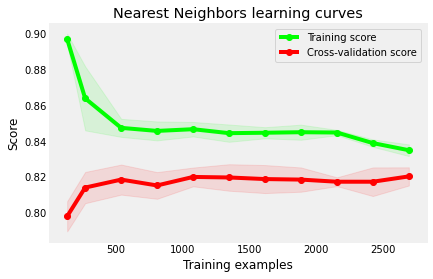

In [104]:
g = plot_learning_curve(catb.grid.best_estimator_, "Nearest Neighbors learning curves", X_train, y_train,
                   cv = 5, train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

Normalized confusion matrix


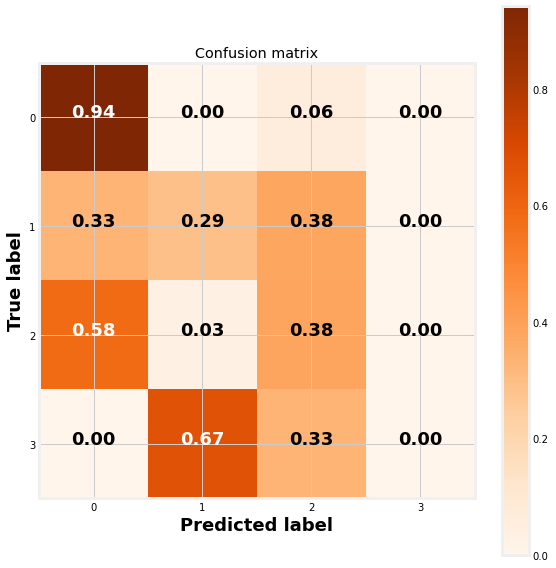

In [105]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,y_pred) 
np.set_printoptions(precision=1)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')

In [106]:

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.94      0.90      1125
           2       0.69      0.29      0.41        87
           3       0.47      0.38      0.42       226
           4       0.00      0.00      0.00         6

    accuracy                           0.81      1444
   macro avg       0.51      0.40      0.43      1444
weighted avg       0.79      0.81      0.79      1444



In [107]:
print(confusion_matrix(y_test,y_pred))

[[1060    0   65    0]
 [  29   25   33    0]
 [ 132    7   87    0]
 [   0    4    2    0]]


### 5.8 Let's vote !

Apply `VotingClassifier` method of the `sklearn` package 

In [108]:
xgb_best =XGBClassifier(**ltv_xgb_model.best_params_)
svc_best = svm.LinearSVC(**svc.grid.best_params_)
lr_best  = linear_model.LogisticRegression(**lr.grid.best_params_)
tr_best  = tree.DecisionTreeClassifier(**tr.grid.best_params_)
rf_best  = ensemble.RandomForestClassifier(**rf.grid.best_params_)
ada_best = ensemble.AdaBoostClassifier(**ada.grid.best_params_)
gb_best  = ensemble.GradientBoostingClassifier(**gb.grid.best_params_)
knn_best = neighbors.KNeighborsClassifier(**knn.grid.best_params_)
lgb_best = lgb.LGBMClassifier(**lbm.grid.best_params_)
catb_best= CatBoostClassifier(**catb.grid.best_params_)

In [109]:
votingC = ensemble.VotingClassifier(estimators=[('ltv_xgb_model',xgb_best),('lr',lr_best),('tr',tr_best),
                                                ('rf', rf_best), ('ada',ada_best),('gb', gb_best),                     
                                                ('knn', knn_best),('lbm', lgb_best),('catb', catb_best)], 
                                    voting='soft')


In [110]:
votingC = votingC.fit(X_train, y_train)

[02:21:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.5
0:	learn: 0.7300105	total: 9.3ms	remaining: 83.7ms
1:	learn: 0.5987465	total: 14.9ms	remaining: 59.8ms
2:	learn: 0.5364318	total: 21.2ms	remaining: 49.4ms
3:	learn: 0.4971496	total: 27.3ms	remaining: 40.9ms
4:	learn: 0.4747530	total: 33.2ms	remaining: 33.2ms
5:	learn: 0.4603139	total: 39.7ms	remaining: 26.4ms
6:	learn: 0.4500032	total: 45.8ms	remaining: 19.6ms
7:	learn: 0.4423387	total: 52.8ms	remaining: 13.2ms
8:	learn: 0.4372376	total: 58.8ms	remaining: 6.53ms
9:	learn: 0.4318351	total: 63.9ms	remaining: 0us


In [111]:
predictions = votingC.predict(X_test)
print("Precision: {:.2f} % ".format(100*metrics.accuracy_score(y_test, predictions)))

Precision: 82.20 % 


Note that when defining the `votingC` classifier, I only used a sub-sample of the whole set of classifiers defined above and only retained the *Random Forest*, the *k-Nearest Neighbors* and the *Gradient Boosting* classifiers. In practice, this choice has been done with respect to the performance of the classification carried out in the next section.

___
## 6. Testing predictions

In the previous section, a few classifiers were trained in order to categorize customers. Until that point, the whole analysis was based on the data of the first 10 months. In this section, I test the model  the last two months of the dataset, that has been stored in the `set_test` dataframe:

In [112]:
classifiers = [(svc, 'Support Vector Machine'),(lr, 'Logostic Regression'),(tr, 'Decision Tree'),
                                              (rf, 'Random Forest'), (ada,"Ada Boost"),(gb, 'Gradient Boosting'),                     
                                               (knn, 'k-Nearest Neighbors'),(lbm, 'lg boost'),(catb, 'cat boost')]
#______________________________
for clf1, label in classifiers:
    print(30*'_', '\n{}'.format(label))
    clf1.grid_predict(X_test,y_test)

______________________________ 
Support Vector Machine
Precision: 80.19 % 
______________________________ 
Logostic Regression
Precision: 81.93 % 
______________________________ 
Decision Tree
Precision: 72.44 % 
______________________________ 
Random Forest
Precision: 80.68 % 
______________________________ 
Ada Boost
Precision: 79.85 % 
______________________________ 
Gradient Boosting
Precision: 82.13 % 
______________________________ 
k-Nearest Neighbors
Precision: 81.09 % 
______________________________ 
lg boost
Precision: 81.79 % 
______________________________ 
cat boost
Precision: 81.16 % 


In [113]:
voting_clf = ensemble.VotingClassifier(estimators=[('ltv_xgb_model',xgb_best),('lr',lr_best),('tr',tr_best),
                                                ('rf', rf_best), ('ada',ada_best),('gb', gb_best),                     
                                                ('knn', knn_best),('lbm', lgb_best),('catb', catb_best)], 
                                    voting='soft')


#fit and predict using training and testing dataset respectively
voting_clf.fit(X_train, y_train)
predictions = voting_clf.predict(X_test)
#Evaluation matrics

[02:21:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.5
0:	learn: 0.7300105	total: 8.13ms	remaining: 73.2ms
1:	learn: 0.5987465	total: 13.8ms	remaining: 55ms
2:	learn: 0.5364318	total: 19.4ms	remaining: 45.4ms
3:	learn: 0.4971496	total: 25.4ms	remaining: 38.1ms
4:	learn: 0.4747530	total: 31.5ms	remaining: 31.5ms
5:	learn: 0.4603139	total: 37.7ms	remaining: 25.1ms
6:	learn: 0.4500032	total: 43.7ms	remaining: 18.7ms
7:	learn: 0.4423387	total: 49.8ms	remaining: 12.4ms
8:	learn: 0.4372376	total: 56.7ms	remaining: 6.3ms
9:	learn: 0.4318351	total: 62.4ms	remaining: 0us


In [114]:
y_pred = predictions
y_pred1 = voting_clf.predict(X_train)

score_list.append('Voting classifier Precision on training set: {:.2f} & test data {:.2f}'.\
      format(precision_score(y_train,y_pred1, average='weighted'),precision_score(y_test,y_pred, average='weighted')))

score_list.append('Voting classifier Recall    on training set: {:.2f} & test data {:.2f}'.\
                  format(recall_score(y_train,y_pred1, average='weighted'),recall_score(y_test,y_pred, average='weighted')))

score_list.append('Voting  classifier F1 score  on training set: {:.2f} & test data {:.2f}'.\
                  format(f1_score(y_train,y_pred1, average='weighted'),f1_score(y_test,y_pred, average='weighted')))

score_list.append('Voting  classifier Accuracy  on training set: {:.2f} & test data {:.2f}'.\
                  format(accuracy_score(y_train,y_pred1 ),accuracy_score(y_test,y_pred)))

In [115]:

print(confusion_matrix(y_test,predictions))

print(classification_report(y_test,predictions))



[[1088    3   34    0]
 [  31   27   29    0]
 [ 155   10   61    0]
 [   0    3    1    2]]
              precision    recall  f1-score   support

           0       0.85      0.97      0.91      1125
           2       0.63      0.31      0.42        87
           3       0.49      0.27      0.35       226
           4       1.00      0.33      0.50         6

    accuracy                           0.82      1444
   macro avg       0.74      0.47      0.54      1444
weighted avg       0.78      0.82      0.79      1444



Normalized confusion matrix


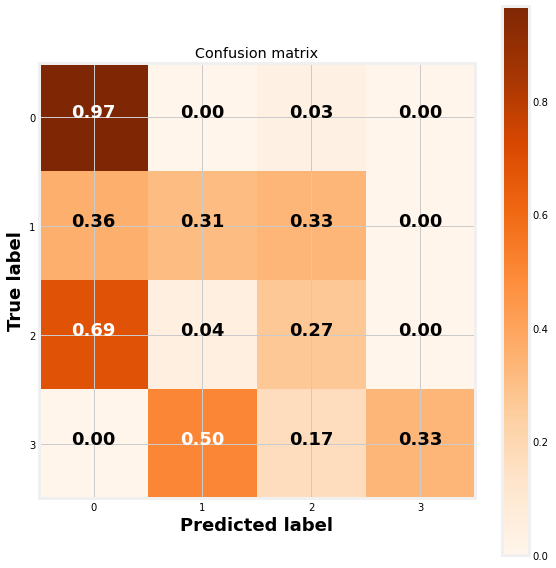

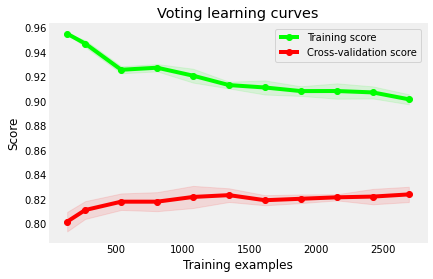

In [116]:
class_names = [i for i in range(4)]

cnf_matrix = confusion_matrix(y_test,predictions) 
np.set_printoptions(precision=1)
plt.figure(figsize = (8,8))

plot_confusion_matrix(cnf_matrix, classes=class_names, normalize = True, title='Confusion matrix')


g = plot_learning_curve(voting_clf, "Voting learning curves", X_train, y_train,
                   cv = 5, train_sizes = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])

In [117]:
score_list

['XGB classifier Precision on training set: 0.88 & test data 0.87',
 'XGB classifier Recall    on training set: 0.88 & test data 0.88',
 'XGB classifier F1 score  on training set: 0.87 & test data 0.87',
 'XGB classifier Accuracy  on training set: 0.88 & test data 0.88',
 'Svc classifier Precision on training set: 0.66 & test data 0.67',
 'Svc classifier Recall    on training set: 0.80 & test data 0.80',
 'Svc classifier F1 score  on training set: 0.73 & test data 0.73',
 'Svc classifier Accuracy  on training set: 0.80 & test data 0.80',
 'LR classifier Precision on training set: 0.80 & test data 0.79',
 'LR classifier Recall    on training set: 0.83 & test data 0.82',
 'LR classifier F1 score  on training set: 0.80 & test data 0.79',
 'LR classifier Accuracy  on training set: 0.83 & test data 0.82',
 'DT classifier Precision on training set: 1.00 & test data 0.74',
 'DT classifier Recall    on training set: 1.00 & test data 0.72',
 'DT classifier F1 score  on training set: 1.00 & test

In [118]:
predictions = votingC.predict(X)
print("Precision: {:.2f} % ".format(100*metrics.accuracy_score(y, predictions)))

Precision: 87.49 % 


### <font color='blue'> Model explainaility </font>

In [119]:
X_Xai=X.copy(deep=True)

In [120]:
X_Xai['Predicted_Labels'] =predictions

In [121]:
X_Xai.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,Predicted_Labels
0,12346,341,37,311.37,1,0
1,12413,146,22,369.00,0,0
2,12426,104,73,1086.86,0,0
3,12427,261,8,112.65,1,0
4,12437,8,361,5914.65,3,2


In [122]:
df_first_sec_yr_group.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,3mnth_Revenue,target_CLV_cluster
0,12346,341,37,311.37,1,0.00,0
1,12413,146,22,369.00,0,176.20,0
2,12426,104,73,1086.86,0,0.00,0
3,12427,261,8,112.65,1,262.36,0
4,12437,8,361,5914.65,3,1482.48,2


<font color='blue'>Prepare data to explane the model, Voting classifier will be used for explaining the model</font>

In [123]:
df_ouput=pd.merge(df_first_sec_yr_group,X_Xai[['Customer ID','Predicted_Labels']], on='Customer ID', how='left')

In [124]:
df_ouput.isnull().sum()

Customer ID           0
Recency               0
Frequency             0
Monetary              0
source_CLV_cluster    0
3mnth_Revenue         0
target_CLV_cluster    0
Predicted_Labels      0
dtype: int64

In [125]:
#gmm_cluster_id is GMM output, CLV_Cluster is based on m9_Revenue
df_ouput.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,3mnth_Revenue,target_CLV_cluster,Predicted_Labels
0,12346,341,37,311.37,1,0.00,0,0
1,12413,146,22,369.00,0,176.20,0,0
2,12426,104,73,1086.86,0,0.00,0,0
3,12427,261,8,112.65,1,262.36,0,0
4,12437,8,361,5914.65,3,1482.48,2,2


In [126]:
df_ouput.groupby('source_CLV_cluster')['Monetary', 'Frequency', 'Recency']\
.mean().sort_values(by=['Monetary','Frequency','Recency'],ascending=False)

,Monetary,Frequency,Recency
source_CLV_cluster,,,
4,103581.980000,6212.000000,1.000000
2,9656.108870,1041.886957,39.739130
3,3200.613922,288.470297,56.495050
0,655.866809,55.856786,84.237026
1,393.321387,39.764255,381.311931


In [127]:
df_ouput.groupby('target_CLV_cluster')['Monetary', 'Frequency', 'Recency']\
.mean().sort_values(by=['Monetary','Frequency','Recency'],ascending=False)

,Monetary,Frequency,Recency
target_CLV_cluster,,,
1,51876.365000,3133.000000,1.000000
4,17602.440000,1991.095238,23.571429
2,4407.995880,437.197880,57.579505
3,1861.501777,160.067270,90.576973
0,570.170776,53.623192,245.476165


In [128]:
df_ouput.groupby('Predicted_Labels')['Monetary', 'Frequency', 'Recency']\
.mean().sort_values(by=['Monetary','Frequency','Recency'],ascending=False)

,Monetary,Frequency,Recency
Predicted_Labels,,,
1,51876.365000,3133.000000,1.000000
4,20122.658125,2421.500000,26.187500
2,6385.534437,622.808743,34.934426
3,2968.925104,247.198157,45.764977
0,575.884107,54.930349,233.781714


In [129]:
df_ouput['Customer ID'].groupby(df_ouput['source_CLV_cluster']).count()

source_CLV_cluster
0    2004
1    2087
2    115 
3    606 
4    1   
Name: Customer ID, dtype: int64

In [130]:
df_ouput['Customer ID'].groupby(df_ouput['target_CLV_cluster']).count()

target_CLV_cluster
0    3734
1    2   
2    283 
3    773 
4    21  
Name: Customer ID, dtype: int64

In [131]:
df_ouput['Customer ID'].groupby(df_ouput['Predicted_Labels']).count()

Predicted_Labels
0    4178
1    2   
2    183 
3    434 
4    16  
Name: Customer ID, dtype: int64

In [132]:
Segment=['High_CLV','Good_CLV','Average_CLV','Low_CLV','Poor_CLV']

In [133]:
temp=df_ouput.groupby('source_CLV_cluster')['Monetary', 'Frequency', 'Recency']\
.mean().sort_values(by=['Monetary','Frequency','Recency'],ascending=False)

for i in range(len(temp.index)):
    df_ouput.loc[df_ouput['source_CLV_cluster']==temp.index[i],'Original_GMM_Segment'] =Segment[i]   

In [134]:
temp=df_ouput.groupby('target_CLV_cluster')['Monetary', 'Frequency', 'Recency']\
.mean().sort_values(by=['Monetary','Frequency','Recency'],ascending=False)

for i in range(len(temp.index)):
    df_ouput.loc[df_ouput['target_CLV_cluster']==temp.index[i],'Future_Realistic_GMM_segment'] =Segment[i]

In [135]:
temp=df_ouput.groupby('Predicted_Labels')['Monetary', 'Frequency', 'Recency']\
.mean().sort_values(by=['Monetary','Frequency','Recency'],ascending=False)

for i in range(len(temp.index)):
    df_ouput.loc[df_ouput['Predicted_Labels']==temp.index[i],'Predicted_segment'] =Segment[i]

In [136]:
df_ouput.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,3mnth_Revenue,target_CLV_cluster,Predicted_Labels,Original_GMM_Segment,Future_Realistic_GMM_segment,Predicted_segment
0,12346,341,37,311.37,1,0.00,0,0,Poor_CLV,Poor_CLV,Poor_CLV
1,12413,146,22,369.00,0,176.20,0,0,Low_CLV,Poor_CLV,Poor_CLV
2,12426,104,73,1086.86,0,0.00,0,0,Low_CLV,Poor_CLV,Poor_CLV
3,12427,261,8,112.65,1,262.36,0,0,Poor_CLV,Poor_CLV,Poor_CLV
4,12437,8,361,5914.65,3,1482.48,2,2,Average_CLV,Average_CLV,Average_CLV


In [137]:
df_ouput['Customer ID'].groupby(df_ouput['Original_GMM_Segment']).count()

Original_GMM_Segment
Average_CLV    606 
Good_CLV       115 
High_CLV       1   
Low_CLV        2004
Poor_CLV       2087
Name: Customer ID, dtype: int64

In [138]:
df_ouput['Customer ID'].groupby(df_ouput['Future_Realistic_GMM_segment']).count() 

Future_Realistic_GMM_segment
Average_CLV    283 
Good_CLV       21  
High_CLV       2   
Low_CLV        773 
Poor_CLV       3734
Name: Customer ID, dtype: int64

In [139]:
df_ouput['Customer ID'].groupby(df_ouput['Predicted_segment']).count() 

Predicted_segment
Average_CLV    183 
Good_CLV       16  
High_CLV       2   
Low_CLV        434 
Poor_CLV       4178
Name: Customer ID, dtype: int64

In [140]:
df_ouput.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,3mnth_Revenue,target_CLV_cluster,Predicted_Labels,Original_GMM_Segment,Future_Realistic_GMM_segment,Predicted_segment
0,12346,341,37,311.37,1,0.00,0,0,Poor_CLV,Poor_CLV,Poor_CLV
1,12413,146,22,369.00,0,176.20,0,0,Low_CLV,Poor_CLV,Poor_CLV
2,12426,104,73,1086.86,0,0.00,0,0,Low_CLV,Poor_CLV,Poor_CLV
3,12427,261,8,112.65,1,262.36,0,0,Poor_CLV,Poor_CLV,Poor_CLV
4,12437,8,361,5914.65,3,1482.48,2,2,Average_CLV,Average_CLV,Average_CLV


In [141]:
df_ouput_XAI = df_ouput.copy(deep=True)

df_ouput_XAI=df_ouput_XAI[['Customer ID','Recency','Frequency','Monetary','source_CLV_cluster','3mnth_Revenue','target_CLV_cluster','Future_Realistic_GMM_segment','Predicted_segment']]
df_ouput_XAI.head()

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,3mnth_Revenue,target_CLV_cluster,Future_Realistic_GMM_segment,Predicted_segment
0,12346,341,37,311.37,1,0.00,0,Poor_CLV,Poor_CLV
1,12413,146,22,369.00,0,176.20,0,Poor_CLV,Poor_CLV
2,12426,104,73,1086.86,0,0.00,0,Poor_CLV,Poor_CLV
3,12427,261,8,112.65,1,262.36,0,Poor_CLV,Poor_CLV
4,12437,8,361,5914.65,3,1482.48,2,Average_CLV,Average_CLV


In [142]:
data= np.array(df_ouput_XAI.drop(['Customer ID','source_CLV_cluster','target_CLV_cluster'],axis=1)) 

In [143]:
#temp=pd.DataFrame(data)
#temp.sort_values(5)

In [144]:
feature_names = ['Recency', 'Frequency', 'Monetary','3mnth_Revenue', 'Future_Realistic_GMM_segment']
feature_names

['Recency',
 'Frequency',
 'Monetary',
 '3mnth_Revenue',
 'Future_Realistic_GMM_segment']

In [145]:
labels = data[:,5]
labels

array(['Poor_CLV', 'Poor_CLV', 'Poor_CLV', ..., 'Poor_CLV', 'Poor_CLV',
       'Low_CLV'], dtype=object)

In [146]:
data=data[:,:-1]

In [147]:
le= preprocessing.LabelEncoder()
le.fit(labels)

LabelEncoder()

In [148]:
class_names = le.classes_
class_names

array(['Average_CLV', 'Good_CLV', 'High_CLV', 'Low_CLV', 'Poor_CLV'],
      dtype=object)

In [149]:
categorical_features = [4]
categorical_names = {}
for feature in categorical_features:
    le = preprocessing.LabelEncoder()
    le.fit(data[:, feature])
    data[:, feature] = le.transform(data[:, feature])
    categorical_names[feature] = le.classes_

In [150]:
data = data.astype(float)

In [151]:
encoder = ColumnTransformer(  [('one_hot_encoder', OneHotEncoder(categories='auto',handle_unknown = "ignore"), [0,1])],\
                            remainder='passthrough'  )

In [152]:
np.random.seed(1)
train, test, labels_train, labels_test = model_selection.train_test_split(data, labels, train_size=0.30)

In [153]:
encoder.fit(data)
encoded_train = encoder.transform(train)

In [154]:
votingC = votingC.fit(encoded_train, labels_train)

[02:22:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.5
0:	learn: 0.5032810	total: 13.1ms	remaining: 118ms
1:	learn: 0.3247785	total: 22.4ms	remaining: 89.8ms
2:	learn: 0.2285951	total: 31.8ms	remaining: 74.2ms
3:	learn: 0.1729949	total: 40.7ms	remaining: 61.1ms
4:	learn: 0.1437912	total: 47.7ms	remaining: 47.7ms
5:	learn: 0.1269089	total: 54.9ms	remaining: 36.6ms
6:	learn: 0.1139355	total: 61.9ms	remaining: 26.5ms
7:	learn: 0.1067154	total: 69.2ms	remaining: 17.3ms
8:	learn: 0.1033751	total: 76.8ms	remaining: 8.53ms
9:	learn: 0.0977727	total: 84.7ms	remaining: 0us


In [155]:
votingC.fit(encoded_train, labels_train)

[02:22:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.5
0:	learn: 0.5032810	total: 13.5ms	remaining: 122ms
1:	learn: 0.3247785	total: 24.1ms	remaining: 96.5ms
2:	learn: 0.2285951	total: 34.1ms	remaining: 79.5ms
3:	learn: 0.1729949	total: 42ms	remaining: 62.9ms
4:	learn: 0.1437912	total: 48.9ms	remaining: 48.9ms
5:	learn: 0.1269089	total: 56.5ms	remaining: 37.7ms
6:	learn: 0.1139355	total: 63.4ms	remaining: 27.2ms
7:	learn: 0.1067154	total: 70.9ms	remaining: 17.7ms
8:	learn: 0.1033751	total: 77.9ms	remaining: 8.66ms
9:	learn: 0.0977727	total: 85.7ms	remaining: 0us


VotingClassifier(estimators=[('ltv_xgb_model',
                              XGBClassifier(base_score=None, booster=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, gamma=None,
                                            gpu_id=None, importance_type='gain',
                                            interaction_constraints=None,
                                            learning_rate=0.1,
                                            max_delta_step=None, max_depth=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_esti...
                              DecisionTreeClassifier(max_features='sqrt')),
                             ('rf',
                              RandomForestClassi

In [156]:
metrics.accuracy_score(labels_test, votingC.predict(encoder.transform(test)))

0.9602373887240356

In [157]:
precision_score(labels_test,votingC.predict(encoder.transform(test)), average='weighted')

0.9587290215291024

In [171]:
predict_fn = lambda x: votingC.predict_proba(encoder.transform(x)).astype(float)

In [172]:
explainer = lime.lime_tabular.LimeTabularExplainer(train ,feature_names = feature_names,class_names=class_names,
                                                   categorical_features=categorical_features, 
                                                   categorical_names=categorical_names, kernel_width=3)

In [160]:
temp=pd.DataFrame(data)
temp.sort_values(4,ascending=False)

,0,1,2,3,4
0,341.0,37.0,3.113700e+02,0.000,4.0
3039,145.0,17.0,1.781900e+02,0.000,4.0
3020,633.0,16.0,3.232500e+02,0.000,4.0
3021,398.0,4.0,9.330000e+01,0.000,4.0
3022,379.0,66.0,1.184560e+03,0.000,4.0
3023,347.0,14.0,3.815100e+02,286.281,4.0
3024,381.0,1.0,2.970000e+01,0.000,4.0
3027,270.0,97.0,1.615520e+03,0.000,4.0
3028,57.0,51.0,6.451300e+02,214.600,4.0
3031,34.0,203.0,1.893800e+03,127.200,4.0


In [161]:
df_ouput[df_ouput['Future_Realistic_GMM_segment'] != df_ouput['Predicted_segment' ]].sort_values('Predicted_segment')

,Customer ID,Recency,Frequency,Monetary,source_CLV_cluster,3mnth_Revenue,target_CLV_cluster,Predicted_Labels,Original_GMM_Segment,Future_Realistic_GMM_segment,Predicted_segment
263,12921,8,1040,17412.720,2,3852.20,4,2,Good_CLV,Good_CLV,Average_CLV
2631,15738,6,307,5098.130,3,622.51,3,2,Average_CLV,Low_CLV,Average_CLV
2242,15260,10,307,5302.600,3,0.00,0,2,Average_CLV,Poor_CLV,Average_CLV
2259,15281,46,436,6494.190,3,140.37,0,2,Average_CLV,Poor_CLV,Average_CLV
2181,15194,32,312,5210.260,3,925.97,3,2,Average_CLV,Low_CLV,Average_CLV
971,13767,18,422,8169.450,2,800.56,3,2,Good_CLV,Low_CLV,Average_CLV
2151,15159,22,314,5505.170,3,4698.00,4,2,Average_CLV,Good_CLV,Average_CLV
3850,17160,19,589,9077.010,2,516.85,3,2,Good_CLV,Low_CLV,Average_CLV
4327,17716,4,436,8044.230,2,747.18,3,2,Good_CLV,Low_CLV,Average_CLV
3549,16814,18,597,6628.740,2,627.57,3,2,Good_CLV,Low_CLV,Average_CLV


15281 Customer was in Average_CLV segment and in Poor_CLV for next 90 days, and its predicted as Average_CLV for next 90 days


12949 Customer was in Good_CLV segment and in Low_CLV for next 90 days, and its predicted as Average_CLV for next 90 days


17675 Customer was in Good_CLV segment and in Good_CLV for next 90 days, and its predicted as Average_CLV for next 90 days


14367 Customer was in Average_CLV segment and in Average_CLV for next 90 days, and its predicted as Low_CLV for next 90 days


14096 Customer was in Low_CLV segment and in High_CLV for next 90 days, and its predicted as High_CLV for next 90 days


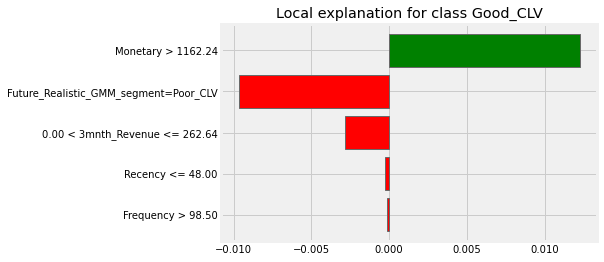

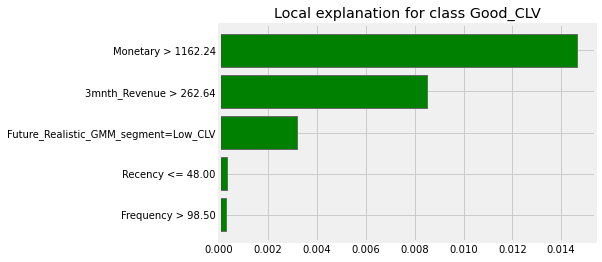

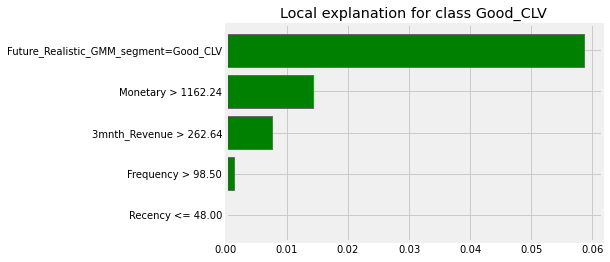

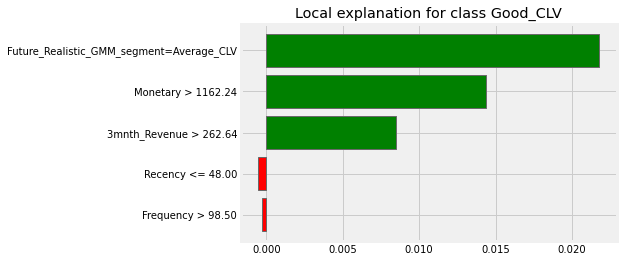

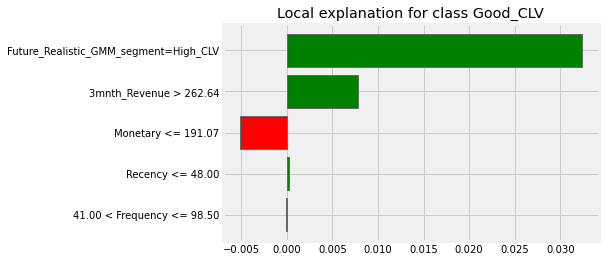

In [175]:
lime_list=[2259,286,4289,1472,1246 ]
 
for i in lime_list:
    print(df_ouput.iloc[i]['Customer ID'], "Customer was in", df_ouput.iloc[i].Original_GMM_Segment  , \
          "segment and in", df_ouput.iloc[i].Future_Realistic_GMM_segment ,"for next 90 days, and its predicted as" ,\
          df_ouput.iloc[i].Predicted_segment,"for next 90 days"  )
    exp = explainer.explain_instance(data[i], predict_fn) 
    exp.show_in_notebook(show_all=False)
    exp.as_pyplot_figure()

___
#### Using SHAP
 

In [163]:
import shap
y_prob = df_first_sec_yr_group["target_CLV_cluster"]

ltv_xgb_model = XGBClassifier( objective="multi:softprob", random_state =123 ,eval_metric='mlogloss')

ltv_xgb_model.fit(X,y_prob)
y_pred = ltv_xgb_model.predict(X_test)

explainer = shap.TreeExplainer(ltv_xgb_model)

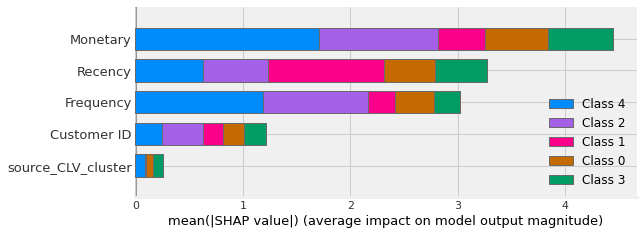

In [164]:
explainer = shap.TreeExplainer(ltv_xgb_model)
shap_values = explainer.shap_values(X,approximate=False)
shap.summary_plot(shap_values, X, plot_type="bar")

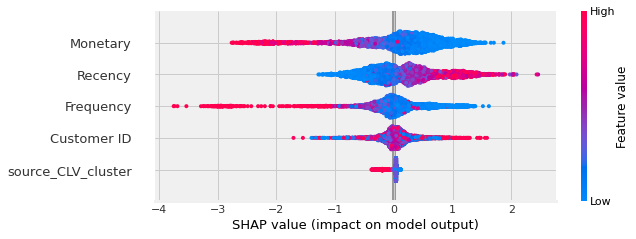

In [165]:
shap.summary_plot(shap_values[0], X)

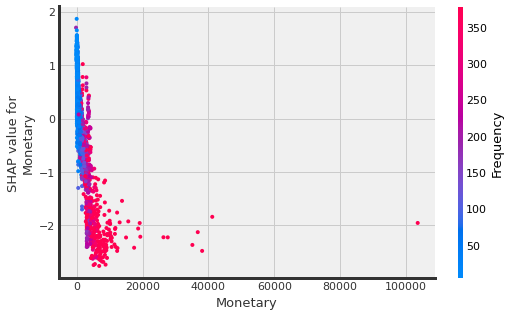

In [166]:
shap.dependence_plot("Monetary", shap_values[0], X)

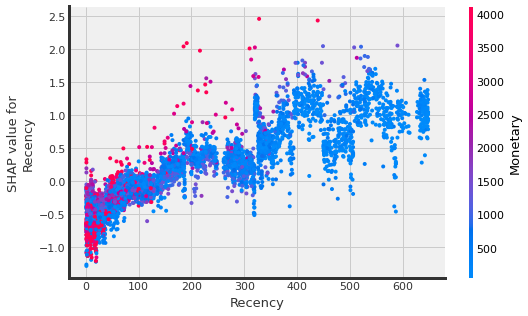

In [167]:
shap.dependence_plot("Recency", shap_values[0], X)

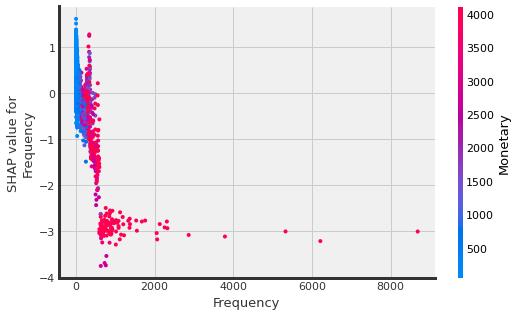

In [168]:
shap.dependence_plot("Frequency", shap_values[0], X)

In [169]:
# plot the SHAP values for the 10th observation 
#shap.force_plot(explainer.expected_value, shap_values[1,:], X.iloc[1,:])